# Objective: Predict which customers are at high risk of churn, for usage based high value customers

## This exercise is divided into the following stages:
- Part 1: Import Data & Data Preparation
- Part 2: Exploratory Data Analysis
- Part 3: Perform Train - Test Split
- Part 4: Principal Component Analysis to Identify Important Features
- Part 5: Build Loginstic Regression Model Using Pipeline with PCA
- Part 6: Buid Decision Tree Model Using Pipeline with PCA
- Part 7: Build Random Forests Model Using Pipeline with PCA
- Part 8: Build SVM Model Using Pipeline with PCA
- Part 9: Final Model Selection
- Part 10: Generate Final Predictions
- Part 11: Analysis & Recommendations

In [1]:
# Import libraries, set display options

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.decomposition import PCA
from sklearn.decomposition import IncrementalPCA
from mpl_toolkits.mplot3d import Axes3D
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import scale
from sklearn import preprocessing
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from sklearn.metrics import precision_recall_curve 
from sklearn.metrics import average_precision_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.model_selection import StratifiedKFold
from sklearn.pipeline import Pipeline
from imblearn.metrics import sensitivity_specificity_support
from sklearn import tree
from sklearn.linear_model import LogisticRegression

import warnings
warnings.filterwarnings('ignore')

pd.set_option('display.max_columns', 250)
pd.set_option('display.max_rows', 250)

## Part 1: Import Data & Data Preparation

In [2]:
telecom_df = pd.read_csv('telecom_churn_data.csv')
telecom_df.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,

In [3]:
telecom_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99999 entries, 0 to 99998
Columns: 226 entries, mobile_number to sep_vbc_3g
dtypes: float64(179), int64(35), object(12)
memory usage: 172.4+ MB


##### Scoping our data to the high valued customer (top 30%) who demonstrated high spending in the initial two months (June and July).
##### Churn Indicator created based on the provided business logic

In [4]:
# create Churn data

#telecom_df1 = telecom_df
telecom_df['total_rech_amt_good_phase'] = (telecom_df['total_rech_amt_6'] + telecom_df['total_rech_amt_7'])/2
telecom_df = telecom_df[telecom_df['total_rech_amt_good_phase'] > telecom_df['total_rech_amt_good_phase'].quantile(0.70)]

# Calculate total usage for 9th month
telecom_df['total_usage_col'] = telecom_df['total_og_mou_9'] + telecom_df['total_ic_mou_9'] + telecom_df['vol_2g_mb_9'] + telecom_df['vol_3g_mb_9']

# Calculate Churn
telecom_df['churn'] = np.where(telecom_df['total_usage_col']== 0, 1, 0)
telecom_df['churn'].value_counts()



0    27390
1     2589
Name: churn, dtype: int64

In [5]:
# Drop columns not required anymore: total_rech_amt_good_phase, total_usage_col
telecom_df = telecom_df.drop(['total_rech_amt_good_phase','total_usage_col'],1)

###### As stated in the scope, dropping all the variables of the 9th month after the churn indicator creation

In [6]:
nine_col = [col for col in telecom_df.columns if '_9' in col]
print(telecom_df.shape)
telecom_df = telecom_df.drop(nine_col, axis = 1)
print(telecom_df.shape)
telecom_df = telecom_df.drop('sep_vbc_3g', axis=1)

(29979, 227)
(29979, 173)


We are now left with 173 columns

###### Calculate Churn Rate

In [7]:
y = telecom_df['churn']
churn = (sum(y)/len(y.index))*100
print(churn)
print(telecom_df.shape)

8.636045231662164
(29979, 172)


Churn rate is 8.63%

In [8]:
telecom_df.describe()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn
count,2.997900e+04,29979.0,29865.0,29865.0,29865.0,29979.000000,29979.000000,29979.000000,29663.000000,29676.000000,29041.000000,29663.000000,29676.000000,29041.000000,29663.000000,29676.000000,29041.000000,29663.00000,29676.000000,29041.000000,29663.000000,29676.000000,29041.000000,29663.000000,29676.000000,29041.000000,29663.000000,29676.000000,29041.000000,29663.000000,29676.000000,29041.000000,29663.000000,29676.000000,29041.000000,29663.000000,29676.000000,29041.000000,29663.000000,29676.000000,29041.000000,29663.000000,29676.00000,29041.000000,29663.0,29676.0,29041.0,29663.000000,29676.000000,29041.000000,29663.000000,29676.000000,29041.000000,29663.000000,29676.000000,29041.000000,29663.000000,29676.000000,29041.000000,29979.000000,29979.000000,29979.000000,29663.000000,29676.000000,29041.000000,29663.000000,29676.000000,29041.000000,29663.000000,29676.000000,29041.000000,29663.000000,29676.000000,29041.000000,29663.000000,29676.000000,29041.000000,29663.000000,29676.000000,29041.000000,29663.000000,29676.000000,29041.000000,29663.0,29676.0,29041.0,29663.000000,29676.000000,29041.000000,29979.000000,29979.000000,29979.000000,29663.000000,29676.000000,29041.00000,29663.000000,29676.000000,29041.000000,29663.000000,29676.000000,29041.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,11387.000000,11652.000000,11741.000000,11387.000000,11652.000000,11741.000000,11387.000000,11652.000000,11741.000000,11387.000000,11652.000000,11741.000000,11387.000000,11652.000000,11741.000000,29979.000000,29979.000000,299

###### Drop Columns with Only 1 value (columns that have zero variance)

In [9]:
#delete coloum as all value are zero or constant
telecom_df = telecom_df.drop(['circle_id','loc_og_t2o_mou','std_og_t2o_mou','loc_ic_t2o_mou','std_og_t2c_mou_6',
                     'std_og_t2c_mou_7','std_og_t2c_mou_8','std_ic_t2o_mou_6','std_ic_t2o_mou_7',
                   'std_ic_t2o_mou_8','last_date_of_month_6','last_date_of_month_7','last_date_of_month_8'], 1)

In [10]:
#Droping colume
fields_to_be_imputed_with_2 = ['fb_user','night_pck_user','arpu_2g','arpu_3g','av_rech_amt_data','count_rech_3g',
'count_rech_2g','max_rech_data','total_rech_data','date_of_last_rech_data']

for field in fields_to_be_imputed_with_2:
    for month in ['6', '7', '8']:
        field_to_be_imputed_with_2 = field + '_' + month
        telecom_df = telecom_df.drop([field_to_be_imputed_with_2], 1)
        
print(telecom_df.shape)

(29979, 129)


In [11]:
telecom_df['date_of_last_rech_6'] = pd.to_datetime(telecom_df.date_of_last_rech_6).dt.day
telecom_df['date_of_last_rech_7'] = pd.to_datetime(telecom_df.date_of_last_rech_7).dt.day
telecom_df['date_of_last_rech_8'] = pd.to_datetime(telecom_df.date_of_last_rech_8).dt.day

###### Check for NULL values

In [12]:
# Derive count of null values for each column
null_values_count = telecom_df.isnull().sum(axis = 0)

# Derive the columns names for the telecom dataframe
columns_name = telecom_df.columns

# covert series output to list
null_values_count = null_values_count.to_list()
columns_name = columns_name.to_list()

# Create a data frame with column names and null values
column_null_value_counts = pd.DataFrame()
column_null_value_counts['Column Name'] = columns_name
column_null_value_counts['Null Value Count'] = null_values_count

# Restrict dataframe column_null_value_counts to only columns with only null values 

column_null_value_counts = column_null_value_counts.loc[column_null_value_counts['Null Value Count'] > 0 ]
column_null_value_counts = column_null_value_counts.reset_index(drop = True)
column_null_value_counts

,Column Name,Null Value Count
0,onnet_mou_6,316
1,onnet_mou_7,303
2,onnet_mou_8,938
3,offnet_mou_6,316
4,offnet_mou_7,303
5,offnet_mou_8,938
6,roam_ic_mou_6,316
7,roam_ic_mou_7,303
8,roam_ic_mou_8,938
9,roam_og_mou_6,316


###### Imputing missing observations with "Median" in the column value

In [13]:
missing_cols = telecom_df.columns[telecom_df.isnull().sum()>0]
for col in missing_cols:
    telecom_df[col].fillna((telecom_df[col].median()), inplace=True)

In [14]:
# Derive count of null values for each column
null_values_count = telecom_df.isnull().sum(axis = 0)

# Derive the columns names for the telecom dataframe
columns_name = telecom_df.columns

# covert series output to list
null_values_count = null_values_count.to_list()
columns_name = columns_name.to_list()

# Create a data frame with column names and null values
column_null_value_counts = pd.DataFrame()
column_null_value_counts['Column Name'] = columns_name
column_null_value_counts['Null Value Count'] = null_values_count

# Restrict dataframe column_null_value_counts to only columns with only null values 

column_null_value_counts = column_null_value_counts.loc[column_null_value_counts['Null Value Count'] > 0 ]
column_null_value_counts = column_null_value_counts.reset_index(drop = True)
column_null_value_counts

,Column Name,Null Value Count


###### Now, there are no columns with NULL values

## Part 2: Perform EDA
- Outlier Treatment
- Derive New Columns
- Correlation Analysis
- Data Visualization

##### Perform Outlier Treatment

In [15]:
telecom_df.describe(percentiles=[0.01, 0.10,.25,.5,.75,.90,.95,.99])
#As we can see we have outliers.

,mobile_number,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn
count,2.997900e+04,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.00000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.00000,29979.00000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.00000
mean,7.001223e+09,587.587624,589.424681,535.067748,297.590611,305.886840,271.137938,421.142281,426.990330,383.029940,17.428073,13.535270,13.263074,29.348362,22.056425,21.483542,95.084989,96.129949,88.149189,182.428031,182.396339,170.618259,6.983204,7.104696,6.505787,1.567723,1.86379,1.714052,284.845600,285.973285,266.230021,190.036338,200.206205,172.600535,203.627289,213.913436,180.518823,2.012068,2.035893,1.790935,396.504945,417.016438,356.472052,2.266842

In [16]:
cont_cols = [col for col in telecom_df.columns if col not in ['churn','mobile_number']]

for col in cont_cols:
    percentiles = telecom_df[col].quantile([0.01,0.99]).values
    telecom_df[col][telecom_df[col] <= percentiles[0]] = percentiles[0]
    telecom_df[col][telecom_df[col] >= percentiles[1]] = percentiles[1]
    

In [17]:
telecom_df.shape

(29979, 129)

In [18]:
print(percentiles[1])

1867.6800000000053


In [19]:
telecom_df.describe(percentiles=[0.01, 0.10,.25,.5,.75,.90,.95,.99])

,mobile_number,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn
count,2.997900e+04,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.0,29979.0,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.000000,29979.00000
mean,7.001223e+09,578.115790,579.934200,524.618925,288.909740,296.580898,261.866393,413.363109,418.408660,373.082685,14.818088,10.647736,10.598445,25.590695,18.618014,17.589295,87.005853,86.958154,79.669254,176.949240,177.581604,166.151190,6.286440,6.406964,5.900735,1.328271,1.539731,1.474835,277.268974,277.966967,259.089428,182.214480,191.929815,164.423316,195.490784,205.382084,170.711203,1.493943,1.449834,1.277414,387.317538,407.213116,345.756086,0.793437,0.794

Completion of Outlier Treatment

##### Derive New Columns

    Average values of 3 months for each attributes were created to check if that value could address all the months.
    Median value of Internet usage (2G + 3G) across months was created to capture the churn rate as it was observed majority of the churn happens when the internet usage pattern shows a decline
    The AON variable was used to create tenure buckets. It was observed larger the tenure, lesser was the churn - as customers who are newly acquired to the network churned more as compared to the old customers.



In [20]:
# month_cols =  ['arpu','onnet_mou','offnet_mou','roam_ic_mou','roam_og_mou','loc_og_t2t_mou','loc_og_t2m_mou','loc_og_t2f_mou',
# 'loc_og_t2c_mou','loc_og_mou','std_og_t2t_mou','std_og_t2m_mou','std_og_t2f_mou','std_og_mou','isd_og_mou',
# 'spl_og_mou','og_others','total_og_mou','loc_ic_t2t_mou','loc_ic_t2m_mou','loc_ic_t2f_mou','loc_ic_mou',
# 'std_ic_t2t_mou','std_ic_t2m_mou','std_ic_t2f_mou','std_ic_mou','total_ic_mou','spl_ic_mou','isd_ic_mou',
# 'ic_others','total_rech_num','total_rech_amt','max_rech_amt','last_day_rch_amt','vol_2g_mb','vol_3g_mb',
# 'monthly_2g','sachet_2g','monthly_3g','sachet_3g']

# month_val = ['6','7','8']
# s = []


# for col in month_cols:

#     col_var_list = [col + "_" + x for x in month_val]
#     avg_val_col = col + "_avg"    
#     s.append(avg_val_col)
#     telecom_df3[avg_val_col] = telecom_df3[col_var_list].mean(axis=1)


# telecom_df3.reset_index(drop=True, inplace=True)

telecom_df['int_usage_median'] = telecom_df[['vol_2g_mb_6','vol_2g_mb_7','vol_2g_mb_8','vol_3g_mb_6','vol_3g_mb_7','vol_3g_mb_8']].median(axis=1)
telecom_df['int_usage_median'] = telecom_df.int_usage_median.map(lambda x: 1 if x == 0 else 0)
telecom_df = telecom_df.drop(['vol_2g_mb_6','vol_2g_mb_7','vol_2g_mb_8','vol_3g_mb_6','vol_3g_mb_7','vol_3g_mb_8'], 1)


telecom_df['tenure_buck'] = np.round(telecom_df['aon']/365,1)
bins = [0, 1, 2, 3, 4, 10]
telecom_df['tenure_buck'] = pd.cut(telecom_df['tenure_buck'], bins)
telecom_df['tenure_buck'].value_counts()

(4, 10]    9681
(1, 2]     7486
(0, 1]     5320
(2, 3]     4530
(3, 4]     2962
Name: tenure_buck, dtype: int64

In [21]:
telecom_df.head()

,mobile_number,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn,int_usage_median,tenure_buck
7,7000701601,1069.180,1349.8500,1988.08226,57.84,54.68,52.29,453.43,567.160,325.91,16.23,33.49,31.64,23.74,12.59,38.06,51.39,31.38,40.28,308.63,447.38,162.28,62.13,55.14,53.23,0.0,0.0,0.00,422.16,533.91,255.79,4.30,23.29,12.01,49.89,31.76,49.14,6.66,20.08,16.68,60.86,75.14,77.84,0.0,0.18,10.01,4.50,0.00,6.50,0.00,0.0,0.0,487.53,609.24,350.16,58.14,32.26,27.31,217.56,221.49,121.19,152.16,101.46,39.53,427.88,355.23,188.04,36.89,11.83,30.39,91.44,126.99,141.33,52.19,34.24,22.21,180.54,173.08,193.94,626.46,558.04,428.74,0.21,0.0,0.0,2.060,14.53,31.5900,15.7400,15.19,15.14,5,5,7,1580.0,790.0,2342.22,1000,790,951,27.0,25.0,26.0,0,0.0,619,0,0,0,0.0,0,0,0,0,0,0,0,0,802,57.74,19.38,18.74,1,1,"(2, 3]"
8,7001524846,378.721,492.2230,137.36200,413.69,351.03,35.08,94.66,80.630,136.48,0.00,0.00,0.00,0.00,0.00,0.00,297.13,217.59,12.49,80.96,70.58,50.54,0.00,0.00,0.00,0.0,0.0,7.15,378.09,288.18,63.04,116.56,133.43,22.58,13.69,10.04,75.69,0.00,0.00,0.00,130.26,143.48,98.28,0.0,0.00,0.00,0.00,0.00,10.23,0.00,0.0,0.0,508.36,431.66,171.56,23.84,9.84,0.31,57.58,13.98,15.48,0.00,0.00,0.00,81.43,23.83,15.79,0.00,0.58,0.10,22.43,4.08,0.65,0.00,0.00,0.00,22.43,4.66,0.75,103.86,28.49,16.54,0.00,0.0,0.0,0.000,0.00,0.0000,0.0000,0.00,0.00,19,21,14,437.0,601.0,120.00,90,154,30,25.0,31.0,30.0,50,0.0,10,0,1,0,0.0,1,3,0,0,0,0,0,0,315,21.03,910.65,122.16,0,0,"(0, 1]"
13,7002191713,492.846,205.6710,593.26000,501.76,108.39,534.24,413.31,119.280,482.46,23.53,144.24,72.11,7.98,35.26,1.44,49.63,6.19,36.01,151.13,47.28,294.46,4.54,0.00,23.51,0.0,0.0,0.49,205.31,53.48,353.99,446.41,85.98,498.23,255.36,52.94,156.94,0.00,0.00,0.00,701.78,138.93,655.18,0.0,0.00,1.29,0.00,0.00,4.78,0.00,0.0,0.0,907.09,192.41,1015.26,67.88,7.58,52.58,142.88,18.53,195.18,4.81,0.00,7.49,215.58,26.11,255.26,115.68,38.29,154.58,308.13,29.79,317.91,0.00,0.00,1.91,423.81,68.09,474.41,968.61,172.58,1144.53,0.45,0.0,0.0,239.192,62.11,249.7384,20.7408,16.24,21.44,6,4,11,507.0,253.0,717.00,110,110,130,20.0,22.0,30.0,110,50.0,0,0,0,0,0.0,0,3,0,0,0,0,0,0,2607,0.00,0.00,0.00,0,1,"(4, 10]"
16,7000875565,430.975,299.8690,187.89400,50.51,74.01,70.61,296.29,229.740,162.76,0.00,2.83,0.00,0.00,17.74,0.00,42.61,65.16,67.38,27

New Columns Dervived: int_usage_median, tenure_buck

##### Correlation Analysis

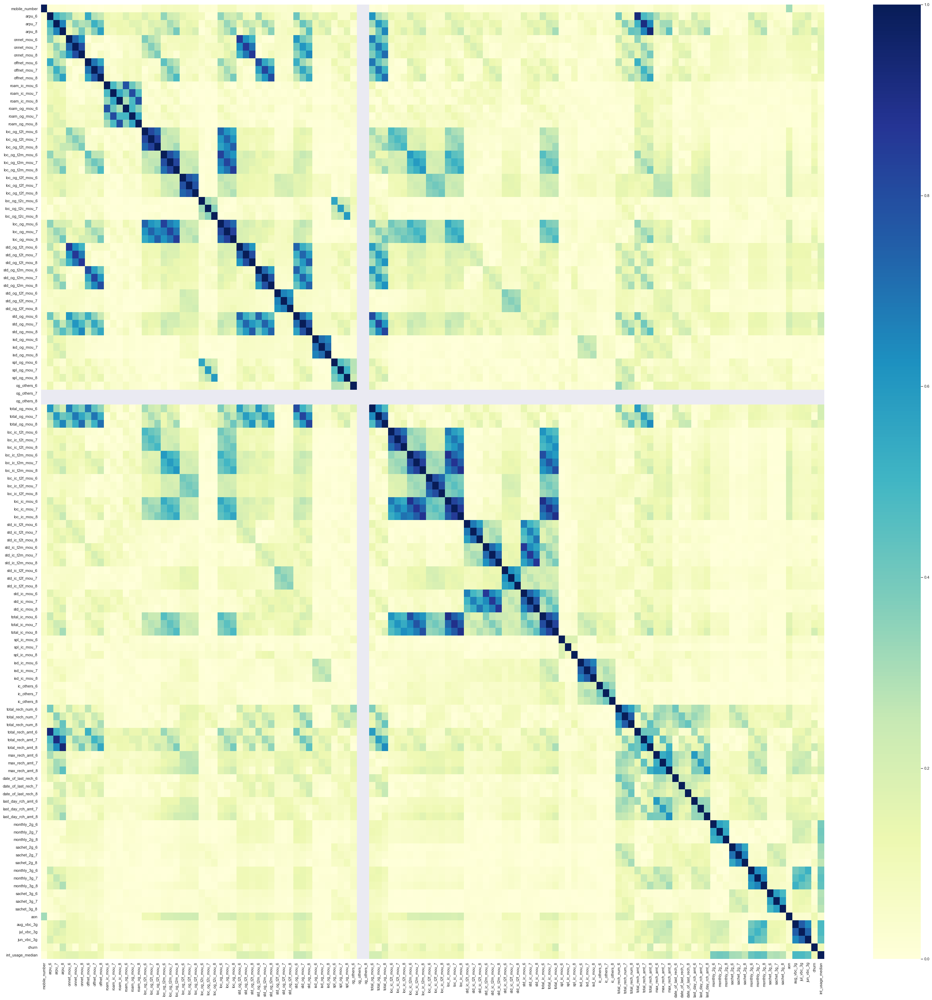

In [22]:
# Create correlation matrix
corr_matrix = telecom_df.corr().abs()
plt.figure(figsize = (50, 50))
sns.set(font_scale=1)
sns.heatmap(corr_matrix, annot = False, cmap="YlGnBu") #, fmt=".2f", annot_kws={"size": 75})
plt.show()

As we can see, there are features with high correlation. Let us now identify and drop those features

In [23]:
# Select upper triangle of correlation matrix
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))

# Find index of feature columns with correlation greater than 0.95
to_drop = [column for column in upper.columns if any(upper[column] > 0.7)]
to_drop

telecom_df = telecom_df.drop(to_drop, 1)

In [24]:
telecom_df.tenure_buck.dtype

CategoricalDtype(categories=[(0, 1], (1, 2], (2, 3], (3, 4], (4, 10]],
              ordered=True)

In [25]:
#create dummy for tenure_buck 
telecom_df = pd.get_dummies(telecom_df, drop_first=True)

telecom_df.rename(columns={"tenure_buck_(1, 2]": "tenure_buck_1_to_2","tenure_buck_(2, 3]":"tenure_buck_2_to_3",
                   "tenure_buck_(3, 4]":"tenure_buck_3_to_4",
                   "tenure_buck_(4, 10]":"tenure_buck_4_to_10"}, inplace=True)

# After outlier treatment droping column which don't have much variance or zero variance
telecom_df = telecom_df.drop(['og_others_7','og_others_8','spl_ic_mou_6','spl_ic_mou_7','spl_ic_mou_8','aon'], 1)

telecom_df.shape

(29979, 66)

##### Data Visualization

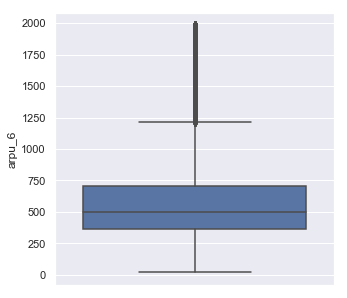

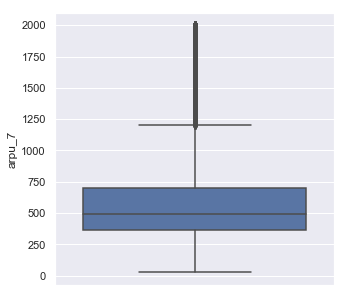

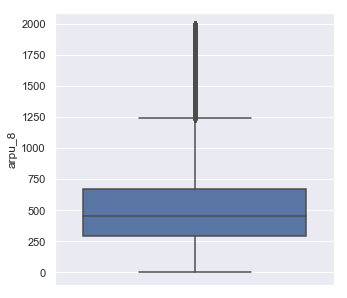

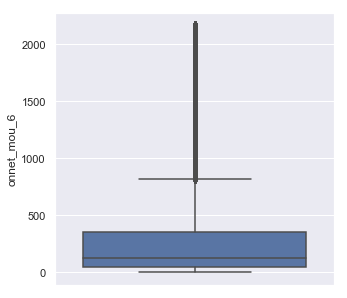

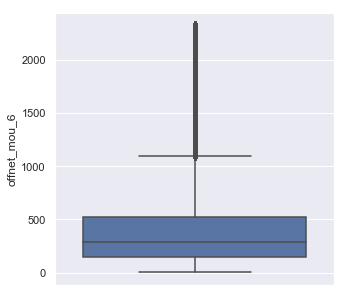

...

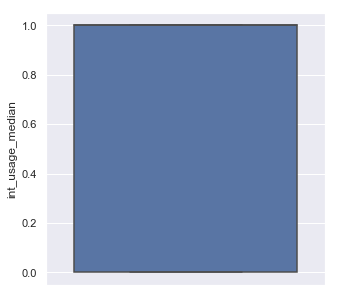

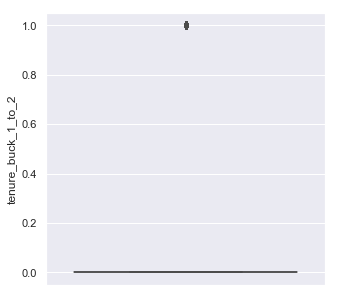

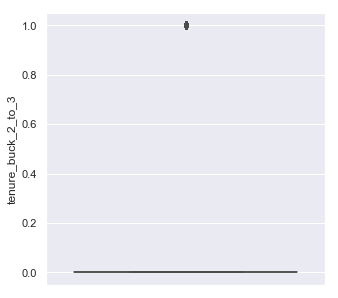

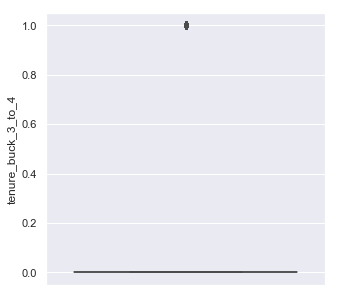

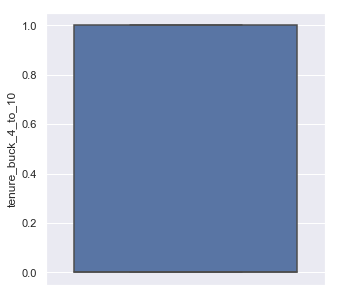

In [26]:
# from scipy.stats import norm
# plt.figure(figsize=(5, 5))
# sns.boxplot(y='arpu_6', data=telecom_df3)
cont_cols = [col for col in telecom_df.columns if col not in ['churn','mobile_number']]
for col in cont_cols:
    plt.figure(figsize=(5, 5))
    sns.boxplot(y=col, data=telecom_df)

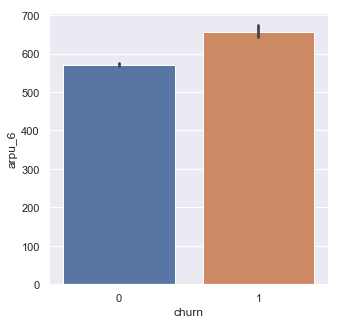

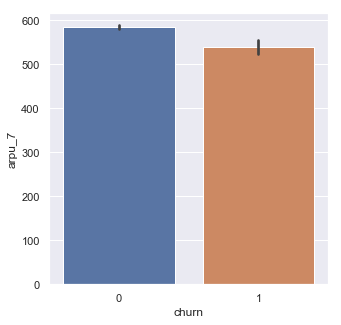

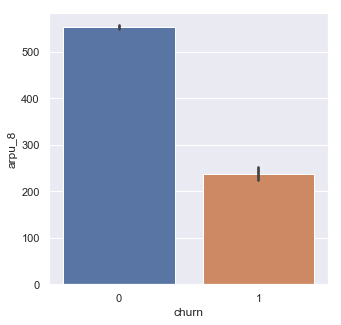

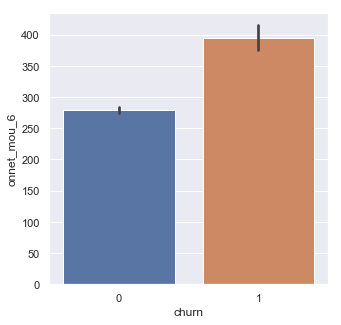

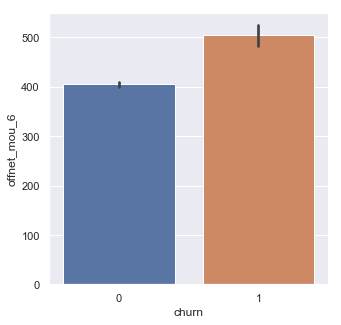

...

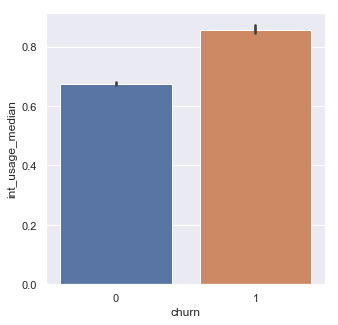

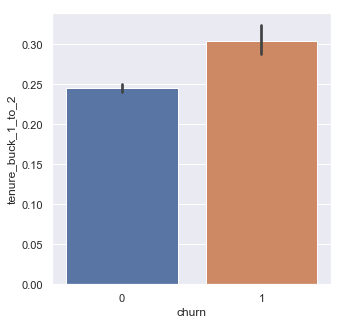

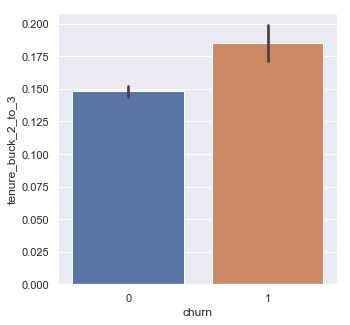

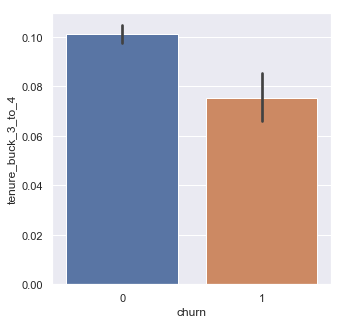

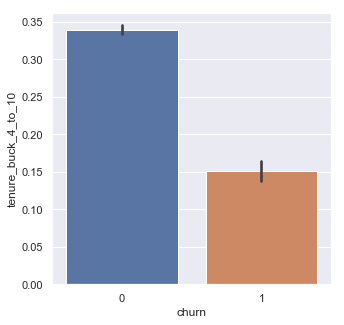

In [27]:
cont_cols = [col for col in telecom_df.columns if col not in ['churn','mobile_number']]
for col in cont_cols:
    plt.figure(figsize=(5, 5))
    sns.barplot(x='churn', y=col, data=telecom_df)
    plt.show()

[Text(0, 0.5, '(%)')]

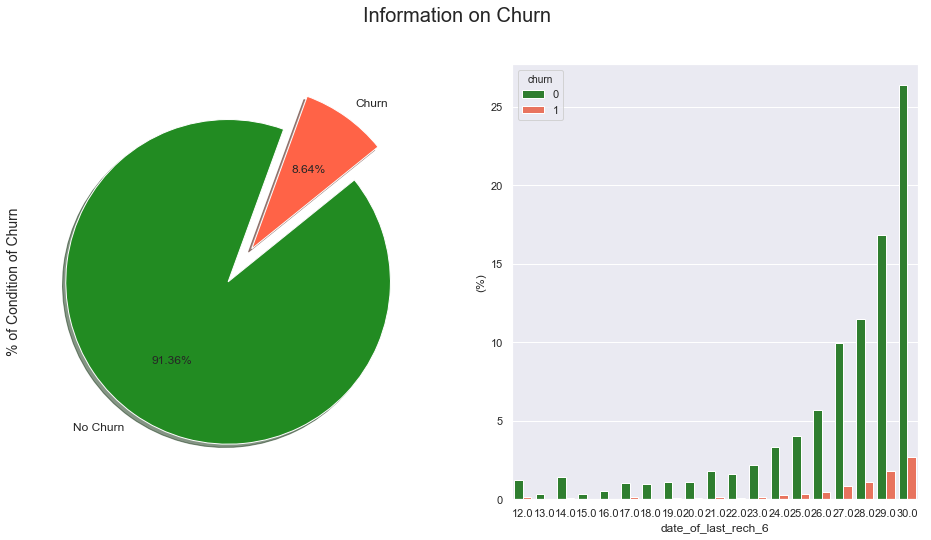

In [28]:
f, ax = plt.subplots(1,2, figsize=(16, 8))
colors = ["#228B22", "#FF6347"]

labels ="No Churn", "Churn"
plt.suptitle('Information on Churn', fontsize=20)

telecom_df["churn"].value_counts().plot.pie(explode=[0,0.25], autopct='%1.2f%%', ax=ax[0], shadow=True, colors=colors, 
                                             labels=labels, fontsize=12, startangle=70)
ax[0].set_ylabel('% of Condition of Churn', fontsize=14)

palette = ["#228B22", "#FF6347"]
sns.barplot(x="date_of_last_rech_6", y="churn", hue="churn", data=telecom_df, palette=palette, estimator=lambda x: len(x) / len(telecom_df) * 100)
ax[1].set(ylabel="(%)")

## Part 3: Peform Train - Test Split

In [29]:
X = telecom_df.drop(['churn','mobile_number'],axis=1)

# Putting response variable to y
y = telecom_df['churn']

# Define a normalisation function 
def normalize (x): 
    return ( (x-np.min(x))/ (max(x) - min(x)))
                                                                                          
# Apply the normalize ( ) to all columns 
X_norm = X.apply(normalize) 
X_norm.head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,offnet_mou_6,offnet_mou_7,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,loc_og_t2t_mou_6,loc_og_t2m_mou_6,loc_og_t2f_mou_6,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,isd_og_mou_6,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,loc_ic_t2t_mou_6,loc_ic_t2m_mou_6,loc_ic_t2f_mou_6,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2m_mou_6,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,isd_ic_mou_6,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aug_vbc_3g,int_usage_median,tenure_buck_1_to_2,tenure_buck_2_to_3,tenure_buck_3_to_4,tenure_buck_4_to_10
7,0.534739,0.670877,1.000000,0.026693,0.194390,0.234889,0.046432,0.114358,0.109657,0.047732,0.268883,0.683540,0.0,0.0,0.000000,0.149929,0.457072,0.42849,0.0,0.063041,0.000000,0.087659,0.000000,0.092945,0.211929,0.771168,0.171040,0.051143,0.232122,0.977323,0.604889,0.449504,0.008612,0.758891,0.601189,0.703205,0.085106,0.085106,1.00,0.790,1.000000,0.833333,0.70,0.80,0.000000,0.000000,1.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.031678,1.0,0.0,1.0,0.0,0.0
8,0.183426,0.236395,0.069093,0.190915,0.040222,0.033002,0.000000,0.000000,0.000000,0.275980,0.070534,0.000000,0.0,0.0,0.247557,0.000000,0.000000,0.00000,0.0,0.000000,0.000000,0.137962,0.000000,0.038112,0.056090,0.000000,0.000000,0.002507,0.056939,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.382979,0.425532,0.09,0.154,0.031546,0.722222,1.00,0.96,0.076336,0.000000,0.016155,0.0,0.5,0.0,0.0,0.333333,0.0,0.0,0.0,0.0,0.0,0.0,0.011538,0.0,0.0,0.0,0.0,0.0
13,0.241494,0.091225,0.298408,0.231559,0.177150,0.049040,0.067316,0.492536,0.249916,0.046097,0.131667,0.049948,0.0,0.0,0.016965,0.000000,0.000000,0.00000,0.0,0.000000,0.000000,0.064463,0.000000,0.108516,0.139182,0.024378,0.536350,0.165535,0.782194,0.000000,0.000000,0.038656,1.000000,1.000000,0.642746,0.995820,0.106383,0.063830,0.11,0.110,0.136698,0.444444,0.55,0.96,0.167939,0.073975,0.000000,0.0,0.0,0.0,0.0,0.333333,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,1.0,0.0,0.0,0.0,1.0
16,0.210013,0.138947,0.094510,0.023310,0.126865,0.094876,0.000000,0.009664,0.000000,0.039577,0.238094,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.00000,0.0,0.000000,0.040793,0.079702,0.000000,0.066072,0.220940,0.044144,0.318945,0.339976,0.047420,0.009550,0.000000,0.044121,0.000000,0.000000,0.000000,0.000000,0.191489,0.106383,0.11,0.110,0.136698,1.000000,1.00,0.32,0.152672,0.147951,0.210016,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,1.0,1.0,0.0,0.0,0.0
17,0.341812,0.000000,0.012826,0.547290,0.026033,0.000000,0.000000,0.016254,0.016670,0.036215,0.051001,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.00000,0.0,0.036144,0.000000,0.000000,0.099845,0.055217,0.046183,0.000000,0.040013,0.000000,0.003249,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.382979,0.021277,0.11,0.000,0.031546,1.000000,0.95,0.76,0.045802,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,1.0,1.0,0.0,0.0,0.0


In [30]:
X_train, X_test, y_train, y_test = train_test_split(X_norm, y, train_size=0.7,test_size=0.3,random_state=100)

print("Number transactions X_train dataset: ", X_train.shape)
print("Number transactions y_train dataset: ", y_train.shape)
print("Number transactions X_test dataset: ", X_test.shape)
print("Number transactions y_test dataset: ", y_test.shape)

Number transactions X_train dataset:  (20985, 64)
Number transactions y_train dataset:  (20985,)
Number transactions X_test dataset:  (8994, 64)
Number transactions y_test dataset:  (8994,)


In [31]:
print("Train: Before OverSampling, counts of label '1': {}".format(sum(y_train==1)))
print("Train: Before OverSampling, counts of label '0': {} \n".format(sum(y_train==0)))

Train: Before OverSampling, counts of label '1': 1774
Train: Before OverSampling, counts of label '0': 19211 



In [32]:
print("Test: Before OverSampling, counts of label '1': {}".format(sum(y_test==1)))
print("Test: Before OverSampling, counts of label '0': {} \n".format(sum(y_test==0)))

Test: Before OverSampling, counts of label '1': 815
Test: Before OverSampling, counts of label '0': 8179 



## Part 4: Principal Component Analysis to Identify Important Features

In [33]:
# Initialize the PCA identifier
pca = PCA(svd_solver='randomized', random_state=42)

# Fit training data
pca.fit(X_train)

PCA(copy=True, iterated_power='auto', n_components=None, random_state=42,
    svd_solver='randomized', tol=0.0, whiten=False)

In [34]:
print(pca.components_)
colnames = list(X_train.columns)
# pcs_df = pd.DataFrame({'PC1':pca.components_[0],'PC2':pca.components_[1], 'Feature':colnames})
# pcs_df.head(10)
pcs_df = pd.DataFrame({'PC1':pca.components_[0],'PC2':pca.components_[1], 
                       'PC3':pca.components_[2],'PC4':pca.components_[3],
                       'PC5':pca.components_[4],'PC6':pca.components_[5],
                       'PC7':pca.components_[6],'PC8':pca.components_[7],
                       'PC9':pca.components_[8],'PC10':pca.components_[9],
                       'Feature':colnames})
pcs_df.head(10)

[[ 2.72369800e-02  3.06142023e-02  5.64744606e-02 ... -1.09460763e-01
  -3.84789123e-02  6.33592602e-01]
 [ 4.19577541e-02  6.06209493e-02  6.47183227e-02 ...  2.56798651e-02
   2.31063559e-02 -4.19414480e-01]
 [ 8.88625902e-03  9.56332595e-03  4.57221498e-03 ...  6.41656186e-01
   1.67820709e-01 -2.97173043e-01]
 ...
 [ 2.69722013e-01  3.88077501e-01 -2.98774943e-01 ... -4.22583790e-03
  -5.99640078e-03 -6.33513615e-03]
 [ 4.76366092e-02  2.09918152e-01 -5.49891390e-02 ...  3.83141678e-03
   8.60569034e-04  1.01377806e-04]
 [-5.87281796e-01  4.24521445e-01  1.24450891e-02 ... -8.18629035e-04
   3.28940982e-03  3.76003736e-03]]


,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,Feature
0,0.027237,0.041958,0.008886,-0.029580,0.334754,0.044592,-0.024739,-0.079073,-0.011122,-0.164485,arpu_6
1,0.030614,0.060621,0.009563,-0.025612,0.346956,0.045207,0.080251,-0.090181,0.177421,0.096112,arpu_7
2,0.056474,0.064718,0.004572,-0.014648,0.346921,0.048834,0.089048,-0.095657,0.200308,0.162758,arpu_8
3,-0.065342,-0.031827,0.015779,-0.060761,0.122063,0.018838,0.060376,-0.005685,0.031335,-0.107348,onnet_mou_6
4,-0.032607,-0.034910,0.001618,-0.042571,0.307146,0.029502,-0.161038,-0.063225,0.022611,-0.156416,offnet_mou_6
5,-0.035729,-0.027867,0.000621,-0.039971,0.299542,0.031006,-0.078613,-0.061785,0.161300,0.026807,offnet_mou_7
6,0.006701,-0.001700,-0.000620,0.033285,0.038057,0.007326,0.059241,-0.040126,0.087562,0.123901,roam_ic_mou_6
7,0.005170,-0.001150,0.001455,0.036703,0.042146,0.008053,0.037328,-0.038812,0.059575,0.099412,roam_ic_mou_7
8,0.006881,0.003549,0.001832,0.028652,0.055464,0.005945,0.029826,-0.036503,0.059132,0.100312,roam_ic_mou_8
9,0.028995,-0.012536,-0.001572,-0.028142,0.096793,0.012246,-0.084573,-0.009598,-0.099175,-0.161676,loc_og_t2t_mou_6


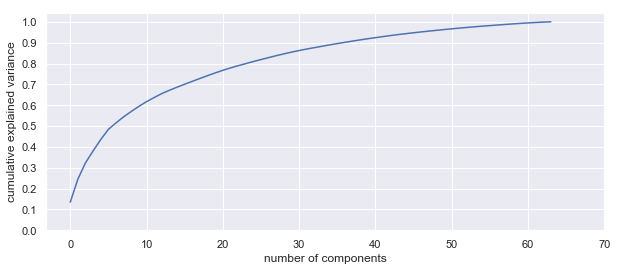

In [35]:
%matplotlib inline
fig = plt.figure(figsize = (10,4))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
plt.xticks(range(0, 80, 10))
plt.yticks(np.arange(0, 1.1, 0.1))
plt.show()

### As we can see 40 component explain more then 90% of variance in the data. We will now build a PCA model with 40 components

In [36]:
pca_final = IncrementalPCA(n_components=40)

df_train_pca = pca_final.fit_transform(X_train)
df_train_pca.shape

(20985, 40)

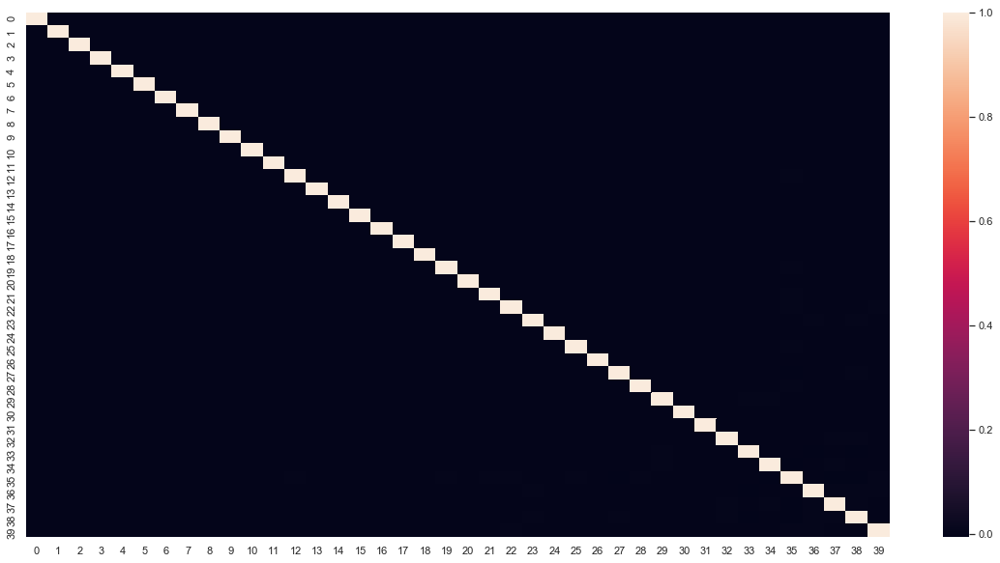

In [37]:
corrmat = np.corrcoef(df_train_pca.transpose())

#plotting the correlation matrix
%matplotlib inline
plt.figure(figsize = (20,10))
sns.heatmap(corrmat,annot = False)

In [38]:
# 1s -> 0s in diagonals
corrmat_nodiag = corrmat - np.diagflat(corrmat.diagonal())
print("max corr:",corrmat_nodiag.max(), ", min corr: ", corrmat_nodiag.min(),)
# we see that correlations are indeed very close to 0

max corr: 0.0038831095582319464 , min corr:  -0.006666116621359413


As we can see, the components have almost zero correlation

###### Check Seperation

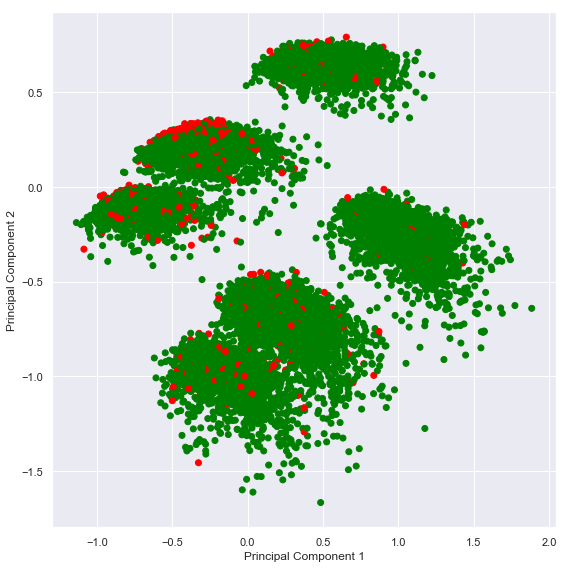

In [39]:
#Applying selected components to the test data - 20 components
df_test_pca = pca_final.transform(X_test)
df_test_pca.shape

%matplotlib inline
fig = plt.figure(figsize = (8,8))
plt.scatter(df_train_pca[:,0], df_train_pca[:,1], c = y_train.map({0:'green',1:'red'}))
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.tight_layout()
plt.show()

###### Check Seperation in 3D

<Figure size 576x576 with 0 Axes>

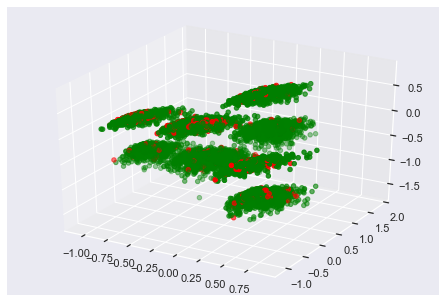

In [40]:
%matplotlib inline
from mpl_toolkits.mplot3d import Axes3D
from mpl_toolkits import mplot3d
fig = plt.figure(figsize=(8,8))
fig = plt.figure()
ax = plt.axes(projection='3d')
ax = Axes3D(fig)
ax.scatter(df_train_pca[:,2], df_train_pca[:,0], df_train_pca[:,1], c=y_train.map({0:'green',1:'red'}))

List the 40 variables identified by PCA for analysis

In [41]:
initial_list = list(telecom_df.columns)
print(type(initial_list))
print(len(initial_list))

<class 'list'>
66


In [42]:
n_pcs= pca_final.components_.shape[0]
most_important = [np.abs(pca_final.components_[i]).argmax() for i in range(n_pcs)]
most_important_names = [initial_list[most_important[i]] for i in range(n_pcs)]

In [43]:
print(len(most_important_names))
most_important_names

40


['tenure_buck_2_to_3',
 'aug_vbc_3g',
 'churn',
 'total_rech_num_6',
 'arpu_7',
 'tenure_buck_1_to_2',
 'monthly_2g_6',
 'spl_og_mou_6',
 'monthly_2g_6',
 'date_of_last_rech_6',
 'arpu_8',
 'date_of_last_rech_6',
 'arpu_8',
 'loc_ic_t2f_mou_6',
 'roam_ic_mou_6',
 'max_rech_amt_8',
 'date_of_last_rech_7',
 'tenure_buck_1_to_2',
 'date_of_last_rech_7',
 'loc_ic_t2f_mou_6',
 'spl_og_mou_8',
 'date_of_last_rech_6',
 'loc_og_t2m_mou_6',
 'last_day_rch_amt_6',
 'loc_og_t2f_mou_6',
 'std_og_t2f_mou_6',
 'loc_og_t2c_mou_6',
 'last_day_rch_amt_7',
 'og_others_6',
 'sachet_3g_8',
 'std_ic_t2t_mou_7',
 'std_ic_t2f_mou_8',
 'last_day_rch_amt_8',
 'monthly_2g_7',
 'monthly_2g_6',
 'monthly_2g_6',
 'date_of_last_rech_8',
 'offnet_mou_7',
 'offnet_mou_7',
 'max_rech_amt_6']

###### Now we have derived the list of most important 40 features. We will now recreate the df_train_pca datafrme withe the selected column names

In [44]:
print(df_train_pca.shape)
print(type(df_train_pca))

(20985, 40)
<class 'numpy.ndarray'>


In [45]:
df_train_pca = pd.DataFrame(df_train_pca, columns = [most_important_names])

In [46]:
df_train_pca.head()

,tenure_buck_2_to_3,aug_vbc_3g,churn,total_rech_num_6,arpu_7,tenure_buck_1_to_2,monthly_2g_6,spl_og_mou_6,monthly_2g_6,date_of_last_rech_6,arpu_8,date_of_last_rech_6,arpu_8,loc_ic_t2f_mou_6,roam_ic_mou_6,max_rech_amt_8,date_of_last_rech_7,tenure_buck_1_to_2,date_of_last_rech_7,loc_ic_t2f_mou_6,spl_og_mou_8,date_of_last_rech_6,loc_og_t2m_mou_6,last_day_rch_amt_6,loc_og_t2f_mou_6,std_og_t2f_mou_6,loc_og_t2c_mou_6,last_day_rch_amt_7,og_others_6,sachet_3g_8,std_ic_t2t_mou_7,std_ic_t2f_mou_8,last_day_rch_amt_8,monthly_2g_7,monthly_2g_6,monthly_2g_6,date_of_last_rech_8,offnet_mou_7,offnet_mou_7,max_rech_amt_6
0,-0.480609,0.223745,-0.795828,-0.019292,0.103783,-0.404235,-0.067624,-0.137272,0.253002,0.241279,-0.390235,0.176857,0.062540,-0.033242,-0.010444,-0.006350,-0.071650,0.012878,-0.111239,0.060458,-0.023301,-0.197662,0.078054,-0.028703,0.185007,0.058831,0.009399,0.198077,0.040987,-0.045639,-0.127581,0.087236,0.072235,0.051853,0.030260,-0.026182,0.055510,-0.017518,-0.014105,-0.043750
1,0.168257,-0.699168,-0.853432,-0.109191,-0.384421,-0.473027,0.187500,-0.167903,0.173316,-0.024085,0.031698,0.191140,-0.209822,-0.051007,0.090001,0.035642,-0.074008,0.131068,-0.128694,0.050226,-0.064323,-0.009584,0.094998,0.123608,-0.045316,-0.031785,-0.044428,0.015492,-0.052942,-0.154402,-0.004919,0.022170,-0.284544,0.112799,0.041492,0.081876,-0.177739,-0.059140,-0.154917,0.104893
2,1.134387,-0.453253,0.086753,0.346475,-0.116613,-0.081900,0.590257,0.108092,0.488360,-0.170467,0.150421,0.136098,-0.356449,-0.044152,0.096287,0.246323,0.074564,0.154762,0.350616,0.009256,0.210833,0.055962,0.218548,-0.183560,0.022370,0.101798,-0.012855,-0.235531,0.224679,0.386453,-0.059086,0.238434,0.151318,-0.056693,-0.337114,0.016187,0.199957,0.069371,0.163947,0.191871
3,-0.276390,0.234376,-0.273652,-0.254736,0.013108,0.908121,0.008639,-0.128074,0.157820,0.036371,-0.270375,0.111860,0.195804,0.060950,0.001929,-0.213285,-0.086336,-0.010159,-0.010508,0.123590,-0.155607,-0.075591,0.008644,-0.012270,0.051739,0.010188,-0.035318,-0.027925,0.081847,-0.089961,-0.189607,0.097889,0.044839,0.080316,-0.001180,0.016825,-0.048528,-0.014003,0.002287,-0.089911
4,-0.702742,-0.045218,0.564255,-0.279419,-0.055255,-0.131315,0.031277,-0.150990,0.087187,-0.017435,-0.240283,-0.106284,-0.073247,0.003321,0.057873,0.018065,0.137061,0.024301,0.102724,0.103928,-0.087301,0.010671,-0.089393,-0.037092,0.054439,-0.080097,-0.057659,0.077779,0.062542,0.092867,0.059631,-0.030014,-0.077747,-0.082025,0.012941,-0.033047,-0.001850,-0.069110,0.013357,-0.014894


###### Run the same for test dataset (df_test_pca)

In [47]:
print(df_test_pca.shape)
print(type(df_test_pca))

(8994, 40)
<class 'numpy.ndarray'>


In [48]:
df_test_pca = pd.DataFrame(df_test_pca, columns = [most_important_names])

In [49]:
df_test_pca.head()

,tenure_buck_2_to_3,aug_vbc_3g,churn,total_rech_num_6,arpu_7,tenure_buck_1_to_2,monthly_2g_6,spl_og_mou_6,monthly_2g_6,date_of_last_rech_6,arpu_8,date_of_last_rech_6,arpu_8,loc_ic_t2f_mou_6,roam_ic_mou_6,max_rech_amt_8,date_of_last_rech_7,tenure_buck_1_to_2,date_of_last_rech_7,loc_ic_t2f_mou_6,spl_og_mou_8,date_of_last_rech_6,loc_og_t2m_mou_6,last_day_rch_amt_6,loc_og_t2f_mou_6,std_og_t2f_mou_6,loc_og_t2c_mou_6,last_day_rch_amt_7,og_others_6,sachet_3g_8,std_ic_t2t_mou_7,std_ic_t2f_mou_8,last_day_rch_amt_8,monthly_2g_7,monthly_2g_6,monthly_2g_6,date_of_last_rech_8,offnet_mou_7,offnet_mou_7,max_rech_amt_6
0,-0.620070,-0.052000,0.537620,-0.017143,0.676100,-0.028890,0.389291,-0.178079,-0.224229,-0.543062,0.339708,0.439733,0.556689,-0.044151,0.090850,-0.084828,0.107573,-0.520760,0.085981,-0.006966,-0.210722,-0.183133,-0.248429,0.163376,0.199757,0.089472,0.016322,0.147192,0.444095,-0.134561,-0.128746,0.125771,-0.087848,-0.138487,-0.062771,-0.073965,0.008409,0.084277,-0.020381,-0.102504
1,-0.217503,0.272999,-0.103835,-0.150747,0.013871,0.126109,0.035164,-0.166239,0.036365,-0.072202,-0.125893,0.091711,0.072972,-0.038590,-0.175834,0.059167,0.048461,-0.373105,-0.092277,-0.073312,0.046342,0.186312,-0.070917,-0.018503,-0.044575,-0.005035,0.076752,0.046815,-0.024123,-0.019814,-0.002188,-0.027752,-0.048713,-0.048952,-0.033453,0.007042,-0.018712,0.051684,0.045339,-0.071315
2,0.501833,0.721850,0.234673,-0.028081,-0.197462,-0.092922,0.192925,0.020056,-0.323567,0.062965,-0.088264,0.186840,-0.102668,0.010947,0.079668,0.109658,-0.051869,-0.038477,-0.057727,0.050232,0.152187,-0.090462,0.107666,-0.065315,0.178250,-0.339718,0.060217,-0.014493,-0.185762,0.110963,-0.029511,-0.062296,0.013159,-0.009202,0.105897,-0.034699,-0.042583,-0.147302,0.214458,-0.052863
3,-0.189152,-0.938008,0.458707,-0.018870,-0.329614,-0.157455,-0.148629,-0.164434,-0.289797,-0.023366,-0.240639,-0.200296,0.131276,-0.124201,-0.069970,0.301713,-0.280616,-0.053671,0.168606,0.332290,-0.079133,-0.103064,-0.041369,0.099877,0.060767,-0.007165,-0.126423,0.228328,-0.115122,0.000142,0.068176,0.112026,0.003248,-0.060293,-0.005386,-0.065960,0.152557,0.110702,0.036882,-0.015412
4,-0.298722,0.192859,-0.294780,-0.256086,0.021864,0.920685,-0.233587,-0.254098,0.327794,0.318997,0.177775,-0.136291,0.223004,0.217633,0.537269,0.114644,-0.307764,-0.122431,0.049277,-0.252604,0.121742,0.075477,-0.014759,0.062669,0.034026,-0.000042,-0.016880,0.125808,-0.113338,0.059703,0.082245,0.117314,0.134263,0.184697,0.056310,-0.035984,0.098374,-0.256468,-0.326996,0.029501


In [50]:
#Applying selected components to the test data - 16 components
df_test_pca = pca_final.transform(X_test)
df_test_pca.shape

(8994, 40)

## Part 5: Build Logistic Regression Model Using Pipeline with PCA 

In [51]:
# create pipeline
PCA_VARS = 40
steps = [('scaler', StandardScaler()),
         ("pca", PCA(n_components=PCA_VARS)),
         ("logistic", LogisticRegression(class_weight='balanced'))
        ]
pipeline = Pipeline(steps)

In [52]:
# fit model
pipeline.fit(X_train, y_train)

# check score on train data
pipeline.score(X_train, y_train)

0.8189182749583036

##### Evaluate on test data

In [53]:
# predict churn on test data
y_pred = pipeline.predict(X_test)

# create onfusion matrix
cm = confusion_matrix(y_test, y_pred)
print(cm)

# check sensitivity and specificity
sensitivity, specificity, _ = sensitivity_specificity_support(y_test, y_pred, average='binary')
print("Sensitivity: \t", round(sensitivity, 2), "\n", "Specificity: \t", round(specificity, 2), sep='')

# check area under curve
y_pred_prob = pipeline.predict_proba(X_test)[:, 1]
print("AUC:    \t", round(roc_auc_score(y_test, y_pred_prob),2))

[[6677 1502]
 [ 164  651]]
Sensitivity: 	0.8
Specificity: 	0.82
AUC:    	 0.87


##### Hyperparameter tuning - PCA and Logistic Regression

In [54]:
# class imbalance
y_train.value_counts()/y_train.shape

0    0.915463
1    0.084537
Name: churn, dtype: float64

##### We will use 40 components identified using PCA and then identify optimal hyperparamters for logistic regression model

In [55]:
# PCA
pca = PCA()

# logistic regression - the class weight is used to handle class imbalance - it adjusts the cost function
logistic = LogisticRegression(class_weight={0:0.1, 1: 0.9})

# create pipeline
steps = [("scaler", StandardScaler()), 
         ("pca", pca),
         ("logistic", logistic)
        ]

# compile pipeline
pca_logistic = Pipeline(steps)

# hyperparameter space
params = {'pca__n_components': [1, 40], 'logistic__C': [0.1, 0.5, 1, 2, 3, 4, 5, 10], 'logistic__penalty': ['l1', 'l2']}

# create 5 folds
folds = StratifiedKFold(n_splits = 5, shuffle = True, random_state = 4)

# create gridsearch object
model = GridSearchCV(estimator=pca_logistic, cv=folds, param_grid=params, scoring='roc_auc', n_jobs=-1, verbose=1)

In [56]:
# fit model
model.fit(X_train, y_train)

Fitting 5 folds for each of 32 candidates, totalling 160 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    8.2s
[Parallel(n_jobs=-1)]: Done 160 out of 160 | elapsed:   25.6s finished


GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=4, shuffle=True),
             error_score='raise-deprecating',
             estimator=Pipeline(memory=None,
                                steps=[('scaler',
                                        StandardScaler(copy=True,
                                                       with_mean=True,
                                                       with_std=True)),
                                       ('pca',
                                        PCA(copy=True, iterated_power='auto',
                                            n_components=None,
                                            random_state=None,
                                            svd_solver='auto', tol=0.0,
                                            whiten=False)),
                                       ('logistic',
                                        LogisticRe...
                                                           multi_class='warn',
       

In [57]:
# cross validation results
pd.DataFrame(model.cv_results_).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_logistic__C,param_logistic__penalty,param_pca__n_components,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.431149,0.084759,0.012500,0.006250,0.1,l1,1,"{'logistic__C': 0.1, 'logistic__penalty': 'l1'...",0.653814,0.620144,0.663544,0.639618,0.606705,0.636767,0.020955,25
1,0.752944,0.030283,0.021868,0.007655,0.1,l1,40,"{'logistic__C': 0.1, 'logistic__penalty': 'l1'...",0.866757,0.872106,0.872620,0.866553,0.879033,0.871413,0.004589,16
2,0.290556,0.015928,0.015621,0.000003,0.1,l2,1,"{'logistic__C': 0.1, 'logistic__penalty': 'l2'...",0.653819,0.620143,0.663545,0.639621,0.606707,0.636769,0.020956,17
3,0.899791,0.035071,0.015620,0.000002,0.1,l2,40,"{'logistic__C': 0.1, 'logistic__penalty': 'l2'...",0.867893,0.872038,0.873783,0.868241,0.878989,0.872188,0.004070,11
4,0.287434,0.015927,0.012496,0.006248,0.5,l1,1,"{'logistic__C': 0.5, 'logistic__penalty': 'l1'...",0.653814,0.620146,0.663542,0.639625,0.606707,0.636769,0.020954,19


In [58]:
# print best hyperparameters
print("Best AUC: ", model.best_score_)
print("Best hyperparameters: ", model.best_params_)

Best AUC:  0.8731025397351687
Best hyperparameters:  {'logistic__C': 4, 'logistic__penalty': 'l2', 'pca__n_components': 40}


[[6911 1268]
 [ 194  621]] 

Accuracy Score : 83.74%
Specificity:  84.50% 
Sensitivity:  76.20%


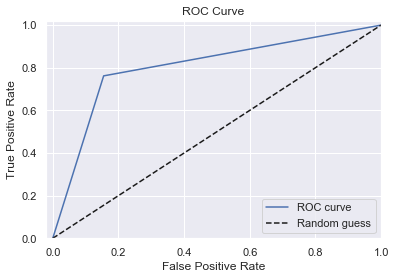

Area Under The Curve:  86.49%


In [59]:
# predict churn on test data
y_pred = model.predict(X_test)

# create onfusion matrix
cm = confusion_matrix(y_test, y_pred)
print(cm, '\n')

# print accuracy
print('Accuracy Score :', "{:.2%}".format(accuracy_score(y_test, y_pred)))

# print sensitivity and specificity
sensitivity, specificity, _ = sensitivity_specificity_support(y_test, y_pred, average='binary')
print("Specificity: ", "{:.2%}".format(specificity), "\nSensitivity: ", "{:.2%}".format(sensitivity))

# plot AUC
fpr, tpr, thresholds = roc_curve(y_test, y_pred)
plt.plot(fpr, tpr, label='ROC curve')
plt.plot([0, 1], [0, 1], 'k--', label='Random guess')
_ = plt.xlabel('False Positive Rate')
_ = plt.ylabel('True Positive Rate')
_ = plt.title('ROC Curve')
_ = plt.xlim([-0.02, 1])
_ = plt.ylim([0, 1.02])
_ = plt.legend(loc="lower right")
plt.show()


# print area under curve
y_pred_prob = model.predict_proba(X_test)[:, 1]
print("Area Under The Curve: ", "{:.2%}".format(roc_auc_score(y_test, y_pred_prob),2))

As we can see sensitivity is less whereas accuracy, specificity & AUC are in acceptable range. Let us now build a decision tree model and check it's performance

## Part 6: Build Decision Tree Model Using Pipeline with PCA

In [60]:
print(type(X_train))
print(type(X_test))

print(X_train.shape)
print(X_test.shape)

print(y_train.shape)
print(y_test.shape)

<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
(20985, 64)
(8994, 64)
(20985,)
(8994,)


###### We will use 40 components identified using PCA and then identify optimal hyperparamters for decision tree model 

In [61]:
# Construct pipeline
pipe = Pipeline([('pca', PCA(n_components=40)), ('clf', tree.DecisionTreeClassifier(random_state=42, class_weight='balanced'))])

# Define parametr grid
grid_params = [{'clf__criterion': ['gini', 'entropy'], 
                'clf__min_samples_leaf': range(5, 50, 5), 
                'clf__min_samples_split': range(5, 50, 5), 
                'clf__max_depth': range(3, 15, 3)}]

n_folds = 5
gs = GridSearchCV(estimator=pipe, param_grid=grid_params, cv=n_folds, n_jobs = -1, verbose = 1, scoring = 'roc_auc')

# Fit using grid search
gs.fit(X_train, y_train)

Fitting 5 folds for each of 648 candidates, totalling 3240 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    9.6s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:   34.4s
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 1242 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 1792 tasks      | elapsed:  6.3min
[Parallel(n_jobs=-1)]: Done 2442 tasks      | elapsed:  8.8min
[Parallel(n_jobs=-1)]: Done 3192 tasks      | elapsed: 12.8min
[Parallel(n_jobs=-1)]: Done 3240 out of 3240 | elapsed: 13.1min finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=Pipeline(memory=None,
                                steps=[('pca',
                                        PCA(copy=True, iterated_power='auto',
                                            n_components=40, random_state=None,
                                            svd_solver='auto', tol=0.0,
                                            whiten=False)),
                                       ('clf',
                                        DecisionTreeClassifier(class_weight='balanced',
                                                               criterion='gini',
                                                               max_depth=None,
                                                               max_features=None,
                                                               max_leaf_nodes=None,
                                                               min_impurity_decreas...
                  

In [62]:
# Best params
print('\nBest params:\n', gs.best_params_)


Best params:
 {'clf__criterion': 'entropy', 'clf__max_depth': 6, 'clf__min_samples_leaf': 35, 'clf__min_samples_split': 10}


In [63]:
# Construct pipeline
pipe = Pipeline([('pca', PCA(n_components=40)), ('clf', tree.DecisionTreeClassifier(class_weight = 'balanced', max_depth = 6, min_samples_leaf = 40, min_samples_split = 25, criterion = 'gini', max_features = 40))])

# Fit the pipeline
pipe.fit(X_train, y_train)

Pipeline(memory=None,
         steps=[('pca',
                 PCA(copy=True, iterated_power='auto', n_components=40,
                     random_state=None, svd_solver='auto', tol=0.0,
                     whiten=False)),
                ('clf',
                 DecisionTreeClassifier(class_weight='balanced',
                                        criterion='gini', max_depth=6,
                                        max_features=40, max_leaf_nodes=None,
                                        min_impurity_decrease=0.0,
                                        min_impurity_split=None,
                                        min_samples_leaf=40,
                                        min_samples_split=25,
                                        min_weight_fraction_leaf=0.0,
                                        presort=False, random_state=None,
                                        splitter='best'))],
         verbose=False)

In [64]:
# Make Predictions
y_pred_dt = pipe.predict(X_test)

In [65]:
print(classification_report(y_test, y_pred_dt))

              precision    recall  f1-score   support

           0       0.96      0.75      0.84      8179
           1       0.22      0.70      0.33       815

    accuracy                           0.75      8994
   macro avg       0.59      0.73      0.59      8994
weighted avg       0.89      0.75      0.80      8994



In [66]:
# Generate the confusion matrix
cm = confusion_matrix(y_test,y_pred_dt)
cm

array([[6128, 2051],
       [ 241,  574]], dtype=int64)

In [67]:
#Print Accuracy, Specificity & Sensitivity
total=sum(sum(cm))

accuracy=(cm[0,0]+cm[1,1])/total
print ('Accuracy: ', "{:.2%}".format(accuracy))

specificity = cm[0,0]/(cm[0,0]+cm[0,1])
print('Specificity: ', "{:.2%}".format(specificity) )

sensitivity = cm[1,1]/(cm[1,0]+cm[1,1])
print('Sensitivity: ', "{:.2%}".format(sensitivity))


Accuracy:  74.52%
Specificity:  74.92%
Sensitivity:  70.43%


Plot the AUC - ROC Curve

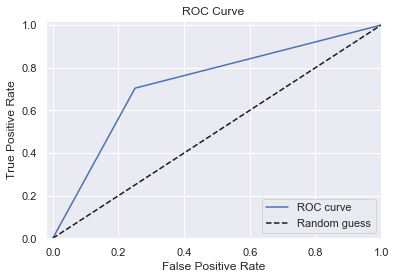

In [68]:
fpr, tpr, thresholds = roc_curve(y_test, y_pred_dt)
plt.plot(fpr, tpr, label='ROC curve')
plt.plot([0, 1], [0, 1], 'k--', label='Random guess')
_ = plt.xlabel('False Positive Rate')
_ = plt.ylabel('True Positive Rate')
_ = plt.title('ROC Curve')
_ = plt.xlim([-0.02, 1])
_ = plt.ylim([0, 1.02])
_ = plt.legend(loc="lower right")
plt.show()

In [69]:
auc = roc_auc_score(y_test, y_pred_dt)
print('Area Under The Curve: ', "{:.2%}".format(auc))

Area Under The Curve:  72.68%


In [70]:
aps = average_precision_score(y_test, y_pred_dt)
print('Average Precision Score: ', "{:.2%}".format(aps))

Average Precision Score:  18.08%


As we can see accuracy, specificity, sensitivity & AUC are below acceptable range with decision tree model. Let us now build a random forest model and check it's performance

## Part 7: Build Random Forests Model Using Pipeline with PCA

In [71]:
print(type(X_train))
print(type(X_test))

print(X_train.shape)
print(X_test.shape)

print(y_train.shape)
print(y_test.shape)

<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
(20985, 64)
(8994, 64)
(20985,)
(8994,)


###### We will use 40 components identified using PCA and then identify optimal hyperparamters for random forest model. As determining n_estimators is a long running task, we will use n_estimators = 30

In [72]:
# Construct pipeline
pipe = Pipeline([('pca', PCA(n_components=40)), ('clf', RandomForestClassifier(random_state=42, class_weight='balanced'))])

# Define parametr grid
grid_params = [{'clf__criterion': ['gini', 'entropy'], 
                'clf__min_samples_leaf': range(5, 50, 5), 
                'clf__min_samples_split': range(5, 50, 5), 
                'clf__max_depth': range(3, 15, 3)}]

n_folds = 5
gs = GridSearchCV(estimator=pipe, param_grid=grid_params, cv=n_folds, n_jobs = -1, verbose = 1, scoring = 'roc_auc')

# Fit using grid search
gs.fit(X_train, y_train)

Fitting 5 folds for each of 648 candidates, totalling 3240 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   10.4s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:   38.9s
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done 1242 tasks      | elapsed:  5.4min
[Parallel(n_jobs=-1)]: Done 1792 tasks      | elapsed:  8.1min
[Parallel(n_jobs=-1)]: Done 2442 tasks      | elapsed: 11.8min
[Parallel(n_jobs=-1)]: Done 3192 tasks      | elapsed: 15.6min
[Parallel(n_jobs=-1)]: Done 3240 out of 3240 | elapsed: 15.9min finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=Pipeline(memory=None,
                                steps=[('pca',
                                        PCA(copy=True, iterated_power='auto',
                                            n_components=40, random_state=None,
                                            svd_solver='auto', tol=0.0,
                                            whiten=False)),
                                       ('clf',
                                        RandomForestClassifier(bootstrap=True,
                                                               class_weight='balanced',
                                                               criterion='gini',
                                                               max_depth=None,
                                                               max_features='auto',
                                                               max_leaf_nodes=None,
                        

In [73]:
# Best params
print('\nBest params:\n', gs.best_params_)


Best params:
 {'clf__criterion': 'entropy', 'clf__max_depth': 12, 'clf__min_samples_leaf': 45, 'clf__min_samples_split': 10}


In [74]:
# Construct pipeline
pipe = Pipeline([('pca', PCA(n_components=40)), ('clf', RandomForestClassifier(
    class_weight = 'balanced', n_estimators = 30, max_depth = 12, 
    min_samples_leaf = 30, min_samples_split = 30, criterion = 'entropy', 
    max_features = 40))])

# Fit the pipeline
pipe.fit(X_train, y_train)

Pipeline(memory=None,
         steps=[('pca',
                 PCA(copy=True, iterated_power='auto', n_components=40,
                     random_state=None, svd_solver='auto', tol=0.0,
                     whiten=False)),
                ('clf',
                 RandomForestClassifier(bootstrap=True, class_weight='balanced',
                                        criterion='entropy', max_depth=12,
                                        max_features=40, max_leaf_nodes=None,
                                        min_impurity_decrease=0.0,
                                        min_impurity_split=None,
                                        min_samples_leaf=30,
                                        min_samples_split=30,
                                        min_weight_fraction_leaf=0.0,
                                        n_estimators=30, n_jobs=None,
                                        oob_score=False, random_state=None,
                                        verbose=

In [75]:
# Make Predictions
y_pred_rf = pipe.predict(X_test)

In [76]:
# Make Predictions
y_pred_dt = pipe.predict(X_test)

print(classification_report(y_test, y_pred_rf))


# Generate the confusion matrix
cm = confusion_matrix(y_test,y_pred_rf)
cm

              precision    recall  f1-score   support

           0       0.96      0.92      0.94      8179
           1       0.42      0.59      0.49       815

    accuracy                           0.89      8994
   macro avg       0.69      0.75      0.71      8994
weighted avg       0.91      0.89      0.90      8994



array([[7511,  668],
       [ 336,  479]], dtype=int64)

In [77]:
#Print Accuracy, Specificity & Sensitivity
total=sum(sum(cm))

accuracy=(cm[0,0]+cm[1,1])/total
print ('Accuracy: ', "{:.2%}".format(accuracy))

specificity = cm[0,0]/(cm[0,0]+cm[0,1])
print('Specificity: ', "{:.2%}".format(specificity) )

sensitivity = cm[1,1]/(cm[1,0]+cm[1,1])
print('Sensitivity: ', "{:.2%}".format(sensitivity))


Accuracy:  88.84%
Specificity:  91.83%
Sensitivity:  58.77%


Plot the ROC Curve

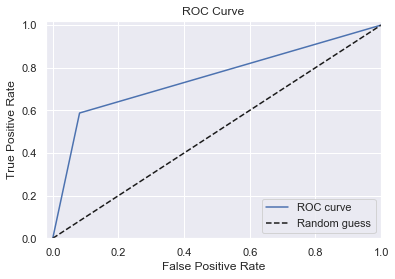

In [78]:
fpr, tpr, thresholds = roc_curve(y_test, y_pred_rf)
plt.plot(fpr, tpr, label='ROC curve')
plt.plot([0, 1], [0, 1], 'k--', label='Random guess')
_ = plt.xlabel('False Positive Rate')
_ = plt.ylabel('True Positive Rate')
_ = plt.title('ROC Curve')
_ = plt.xlim([-0.02, 1])
_ = plt.ylim([0, 1.02])
_ = plt.legend(loc="lower right")
plt.show()

In [79]:
auc = roc_auc_score(y_test, y_pred_rf)
print('Area Under The Curve: ', "{:.2%}".format(auc))

Area Under The Curve:  75.30%


In [80]:
aps = average_precision_score(y_test, y_pred_rf)
print('Average Precision Score: ', "{:.2%}".format(aps))

Average Precision Score:  28.28%


Accuracy and Specificity are acceptable, however, we have low sensitivity. We will now build another random forest after further tweaking the hyperparameters:
- min_samples_leaf = 60
- min_samples_split = 60

In [81]:
# Construct pipeline
pipe = Pipeline([('pca', PCA(n_components=40)), ('clf', RandomForestClassifier(
    class_weight = 'balanced', n_estimators = 50, max_depth = 12, 
    min_samples_leaf = 60, min_samples_split = 60, criterion = 'entropy', 
    max_features = 40))])

# Fit the pipeline
pipe.fit(X_train, y_train)

# Make Predictions
y_pred_rf = pipe.predict(X_test)

# Make Predictions
y_pred_dt = pipe.predict(X_test)

print(classification_report(y_test, y_pred_rf))


# Generate the confusion matrix
cm = confusion_matrix(y_test,y_pred_rf)
print(cm)

#Print Accuracy, Specificity & Sensitivity
total=sum(sum(cm))

accuracy=(cm[0,0]+cm[1,1])/total
print ('Accuracy: ', "{:.2%}".format(accuracy))

specificity = cm[0,0]/(cm[0,0]+cm[0,1])
print('Specificity: ', "{:.2%}".format(specificity) )

sensitivity = cm[1,1]/(cm[1,0]+cm[1,1])
print('Sensitivity: ', "{:.2%}".format(sensitivity))


              precision    recall  f1-score   support

           0       0.96      0.89      0.92      8179
           1       0.37      0.66      0.47       815

    accuracy                           0.87      8994
   macro avg       0.66      0.77      0.70      8994
weighted avg       0.91      0.87      0.88      8994

[[7252  927]
 [ 281  534]]
Accuracy:  86.57%
Specificity:  88.67%
Sensitivity:  65.52%


We see that sensitivity has further increased but still below desired levels

Plot the ROC Curve

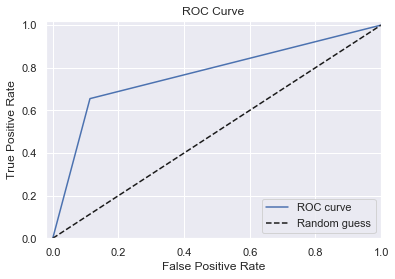

In [82]:
fpr, tpr, thresholds = roc_curve(y_test, y_pred_rf)
plt.plot(fpr, tpr, label='ROC curve')
plt.plot([0, 1], [0, 1], 'k--', label='Random guess')
_ = plt.xlabel('False Positive Rate')
_ = plt.ylabel('True Positive Rate')
_ = plt.title('ROC Curve')
_ = plt.xlim([-0.02, 1])
_ = plt.ylim([0, 1.02])
_ = plt.legend(loc="lower right")
plt.show()

In [83]:
auc = roc_auc_score(y_test, y_pred_rf)
print('Area Under The Curve: ', "{:.2%}".format(auc))

aps = average_precision_score(y_test, y_pred_rf)
print('Average Precision Score: ', "{:.2%}".format(aps))

Area Under The Curve:  77.09%
Average Precision Score:  27.07%


As we can see accuracy & specificity are in acceptable range. However, sensitivity & AUC are below acceptable range with rabndom forest model. Let us now build an SVM model and check it's performance

## Part 8: Build SVM Model Using Pipeline with PCA (Using 40 components)

##### We will use 40 components identified using PCA and then identify optimal hyperparamters for SVM model 

In [84]:
# Construct pipeline
pipe = Pipeline([('pca', PCA(n_components=40)), ('svm', SVC(random_state=42, class_weight='balanced'))])

# Define parametr grid
n_components = [20, 40, 64]

params_grid = {
    'svm__C': [1, 10, 100, 1000],
    'svm__kernel': ['rbf', 'linear'],
    'svm__gamma': [0.01, 0.001, 0.0001]
}

n_folds = 5
estimator = GridSearchCV(estimator=pipe, param_grid = params_grid, cv=n_folds, n_jobs = -1, verbose = 1, scoring = 'roc_auc')

# Fit using grid search
estimator.fit(X_train, y_train)


Fitting 5 folds for each of 24 candidates, totalling 120 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:  6.7min
[Parallel(n_jobs=-1)]: Done 120 out of 120 | elapsed: 62.2min finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=Pipeline(memory=None,
                                steps=[('pca',
                                        PCA(copy=True, iterated_power='auto',
                                            n_components=40, random_state=None,
                                            svd_solver='auto', tol=0.0,
                                            whiten=False)),
                                       ('svm',
                                        SVC(C=1.0, cache_size=200,
                                            class_weight='balanced', coef0=0.0,
                                            decision_function_shape='ovr',
                                            degree=3, gamma='auto_deprecated',
                                            kernel='rbf', max_iter=-1,
                                            probability=False, random_state=42,
                                            shrinking=True, tol=0.0

In [85]:
# Best params
print('Best params:\n', estimator.best_params_)


Best params:
 {'svm__C': 100, 'svm__gamma': 0.01, 'svm__kernel': 'rbf'}


Build a non linear SVM model with C: 0.01 and Gamma: 100

In [86]:
pipe = Pipeline([('pca', PCA(n_components=40)), ('svm', SVC(random_state=42, class_weight='balanced', C = 100, gamma = 0.01, kernel = 'rbf', verbose = 1 ))])


# Fit the pipeline
pipe.fit(X_train, y_train)

[LibSVM]

Pipeline(memory=None,
         steps=[('pca',
                 PCA(copy=True, iterated_power='auto', n_components=40,
                     random_state=None, svd_solver='auto', tol=0.0,
                     whiten=False)),
                ('svm',
                 SVC(C=100, cache_size=200, class_weight='balanced', coef0=0.0,
                     decision_function_shape='ovr', degree=3, gamma=0.01,
                     kernel='rbf', max_iter=-1, probability=False,
                     random_state=42, shrinking=True, tol=0.001, verbose=1))],
         verbose=False)

In [87]:
# Make predictions
y_pred_svm = pipe.predict(X_test)

print(classification_report(y_test, y_pred_svm))


# Generate the confusion matrix
cm = confusion_matrix(y_test,y_pred_svm)
print(cm)

#Print Accuracy, Specificity & Sensitivity
total=sum(sum(cm))

accuracy=(cm[0,0]+cm[1,1])/total
print ('Accuracy: ', "{:.2%}".format(accuracy))

specificity = cm[0,0]/(cm[0,0]+cm[0,1])
print('Specificity: ', "{:.2%}".format(specificity) )

sensitivity = cm[1,1]/(cm[1,0]+cm[1,1])
print('Sensitivity: ', "{:.2%}".format(sensitivity))

              precision    recall  f1-score   support

           0       0.98      0.85      0.91      8179
           1       0.36      0.81      0.50       815

    accuracy                           0.85      8994
   macro avg       0.67      0.83      0.70      8994
weighted avg       0.92      0.85      0.87      8994

[[6983 1196]
 [ 151  664]]
Accuracy:  85.02%
Specificity:  85.38%
Sensitivity:  81.47%


Plot the ROC Curve

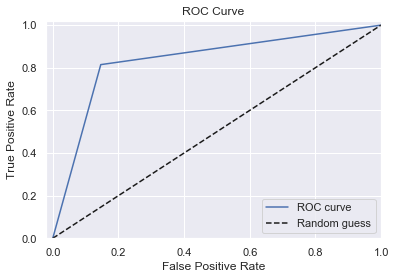

In [88]:
fpr, tpr, thresholds = roc_curve(y_test, y_pred_svm)
plt.plot(fpr, tpr, label='ROC curve')
plt.plot([0, 1], [0, 1], 'k--', label='Random guess')
_ = plt.xlabel('False Positive Rate')
_ = plt.ylabel('True Positive Rate')
_ = plt.title('ROC Curve')
_ = plt.xlim([-0.02, 1])
_ = plt.ylim([0, 1.02])
_ = plt.legend(loc="lower right")
plt.show()

In [89]:
auc = roc_auc_score(y_test, y_pred_rf)
print('Area Under The Curve: ', "{:.2%}".format(auc))

aps = average_precision_score(y_test, y_pred_rf)
print('Average Precision Score: ', "{:.2%}".format(aps))

Area Under The Curve:  77.09%
Average Precision Score:  27.07%


## Part 9: Final Model Selection

We have much better accuracy, sensitivity and specificity with a non linear SVM model. Hence, a non linear is the best model to use for churn prediction. Best parameters: 
- Number of PCA Components: 40
- SVM Model Type: RBF
- SVM Hyerparameter C: 0.01
- SVM Hyerparameter Gamma: 100

## Part 10: Generate Final Predictions

Generate the final dataset with columns: mobile_number, actual_churn and predicted_churn

In [90]:
# Generate the final prediction dataframe
mobile_number = telecom_df['mobile_number']
y_actual = telecom_df['churn']

final_prediction_df = pd.DataFrame()
final_prediction_df['mobile_number'] = mobile_number
final_prediction_df['Actual Churn'] = y_actual

final_prediction_df.head()

,mobile_number,Actual Churn
7,7000701601,1
8,7001524846,0
13,7002191713,0
16,7000875565,0
17,7000187447,0


Make Final Predictions on entire data set (X_norm)

In [91]:
# Make final predictions
y_pred_final = pipe.predict(X_norm)

# Print the classification report
print(classification_report(y_actual, y_pred_final))


# Generate the confusion matrix
cm = confusion_matrix(y_actual, y_pred_final)
print(cm)

#Print Accuracy, Specificity & Sensitivity
total=sum(sum(cm))

accuracy=(cm[0,0]+cm[1,1])/total
print ('Accuracy: ', "{:.2%}".format(accuracy))

specificity = cm[0,0]/(cm[0,0]+cm[0,1])
print('Specificity: ', "{:.2%}".format(specificity) )

sensitivity = cm[1,1]/(cm[1,0]+cm[1,1])
print('Sensitivity: ', "{:.2%}".format(sensitivity))

              precision    recall  f1-score   support

           0       0.98      0.86      0.92     27390
           1       0.36      0.84      0.50      2589

    accuracy                           0.86     29979
   macro avg       0.67      0.85      0.71     29979
weighted avg       0.93      0.86      0.88     29979

[[23505  3885]
 [  417  2172]]
Accuracy:  85.65%
Specificity:  85.82%
Sensitivity:  83.89%


Plot the ROC Curve

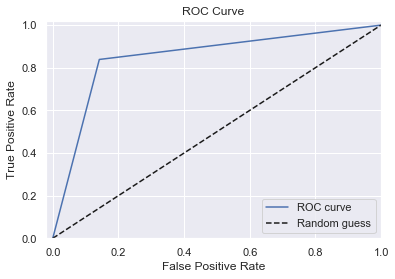

In [92]:
fpr, tpr, thresholds = roc_curve(y_actual, y_pred_final)
plt.plot(fpr, tpr, label='ROC curve')
plt.plot([0, 1], [0, 1], 'k--', label='Random guess')
_ = plt.xlabel('False Positive Rate')
_ = plt.ylabel('True Positive Rate')
_ = plt.title('ROC Curve')
_ = plt.xlim([-0.02, 1])
_ = plt.ylim([0, 1.02])
_ = plt.legend(loc="lower right")
plt.show()

In [93]:
auc = roc_auc_score(y_actual,y_pred_final)
print('Area Under The Curve: ', "{:.2%}".format(auc))

aps = average_precision_score(y_test, y_pred_rf)
print('Average Precision Score: ', "{:.2%}".format(aps))


Area Under The Curve:  84.85%
Average Precision Score:  27.07%


#### We have good final results with SVM Model and PCA derived components (40 components): 
- Accuracy: 85%
- Specificity: 85%
- Sensitivity: 84%
- Area Under the Curve: 85%

In [94]:
# Align the final prediction data frame
final_prediction_df['Predicted Churn'] = y_pred_final
final_prediction_df = final_prediction_df.reset_index(drop = True)

final_prediction_df.head()

,mobile_number,Actual Churn,Predicted Churn
0,7000701601,1,0
1,7001524846,0,0
2,7002191713,0,0
3,7000875565,0,1
4,7000187447,0,1


In [95]:
final_prediction_df['Actual Churn'] = final_prediction_df['Actual Churn'].replace(0, 'No Churn')
final_prediction_df['Actual Churn'] = final_prediction_df['Actual Churn'].replace(1, 'Churn')

final_prediction_df['Predicted Churn'] = final_prediction_df['Predicted Churn'].replace(0, 'No Churn')
final_prediction_df['Predicted Churn'] = final_prediction_df['Predicted Churn'].replace(1, 'Churn')

final_prediction_df.head()

,mobile_number,Actual Churn,Predicted Churn
0,7000701601,Churn,No Churn
1,7001524846,No Churn,No Churn
2,7002191713,No Churn,No Churn
3,7000875565,No Churn,Churn
4,7000187447,No Churn,Churn


#### Write the final_prediction_df to CSV file

In [96]:
final_prediction_df.to_csv('final_prediction_df.csv', sep = ',')

## Part 11: Analysis & Recommendations

##### ARPU 7th and 8th: Average Revenue Per User decreases from 6th to 7th month to 8th month as most of the users are churned by 8th month.

##### date_of_last_rech_8: Most of the Users are churned between 25th to 31st of the month. 

##### last_day_rch_amt_8: Lower the last day recharge amount higher the churn rate. 

###### roam_ic_mou_8: Higher the incoming roaming amount, higher is the churn rate. 

###### std_ic_t2f_mou_8: Lower the STD incoming call, higher is the churn rate. 

### Recommendations: 
- Providing offers prior to 25th can reduce the churn. Send out periodic offers to customers between 15th of the month to 25th of the month.
- Focus on customers whos last day recharge amount has decrased. Specifically for customers without any recharge amount.
- Focus on customers whose incoming roaming amount has increased, because they are likely to churn.
- Focus on customers whose STD incoming call amount has decreased for that month.
- Focus on the customer whoes Avg max recharge amount has been decreased



In [98]:
final_prediction_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29979 entries, 0 to 29978
Data columns (total 3 columns):
mobile_number      29979 non-null int64
Actual Churn       29979 non-null object
Predicted Churn    29979 non-null object
dtypes: int64(1), object(2)
memory usage: 702.7+ KB


In [100]:
telecom_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 29979 entries, 7 to 99997
Data columns (total 66 columns):
mobile_number          29979 non-null int64
arpu_6                 29979 non-null float64
arpu_7                 29979 non-null float64
arpu_8                 29979 non-null float64
onnet_mou_6            29979 non-null float64
offnet_mou_6           29979 non-null float64
offnet_mou_7           29979 non-null float64
roam_ic_mou_6          29979 non-null float64
roam_ic_mou_7          29979 non-null float64
roam_ic_mou_8          29979 non-null float64
loc_og_t2t_mou_6       29979 non-null float64
loc_og_t2m_mou_6       29979 non-null float64
loc_og_t2f_mou_6       29979 non-null float64
loc_og_t2c_mou_6       29979 non-null float64
loc_og_t2c_mou_7       29979 non-null float64
loc_og_t2c_mou_8       29979 non-null float64
std_og_t2f_mou_6       29979 non-null float64
std_og_t2f_mou_7       29979 non-null float64
std_og_t2f_mou_8       29979 non-null float64
isd_og_mou_6       

In [101]:
help(pd.merge)

Help on function merge in module pandas.core.reshape.merge:

merge(left, right, how='inner', on=None, left_on=None, right_on=None, left_index=False, right_index=False, sort=False, suffixes=('_x', '_y'), copy=True, indicator=False, validate=None)
    Merge DataFrame or named Series objects with a database-style join.
    
    The join is done on columns or indexes. If joining columns on
    columns, the DataFrame indexes *will be ignored*. Otherwise if joining indexes
    on indexes or indexes on a column or columns, the index will be passed on.
    
    Parameters
    ----------
    left : DataFrame
    right : DataFrame or named Series
        Object to merge with.
    how : {'left', 'right', 'outer', 'inner'}, default 'inner'
        Type of merge to be performed.
    
        * left: use only keys from left frame, similar to a SQL left outer join;
          preserve key order.
        * right: use only keys from right frame, similar to a SQL right outer join;
          preserve key 

In [102]:
telecom_df_copy = telecom_df

In [107]:
telecom_df = pd.merge(telecom_df, final_prediction_df, how = 'inner', on = 'mobile_number')

In [108]:
telecom_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 29979 entries, 0 to 29978
Data columns (total 68 columns):
mobile_number          29979 non-null int64
arpu_6                 29979 non-null float64
arpu_7                 29979 non-null float64
arpu_8                 29979 non-null float64
onnet_mou_6            29979 non-null float64
offnet_mou_6           29979 non-null float64
offnet_mou_7           29979 non-null float64
roam_ic_mou_6          29979 non-null float64
roam_ic_mou_7          29979 non-null float64
roam_ic_mou_8          29979 non-null float64
loc_og_t2t_mou_6       29979 non-null float64
loc_og_t2m_mou_6       29979 non-null float64
loc_og_t2f_mou_6       29979 non-null float64
loc_og_t2c_mou_6       29979 non-null float64
loc_og_t2c_mou_7       29979 non-null float64
loc_og_t2c_mou_8       29979 non-null float64
std_og_t2f_mou_6       29979 non-null float64
std_og_t2f_mou_7       29979 non-null float64
std_og_t2f_mou_8       29979 non-null float64
isd_og_mou_6       

In [110]:
telecom_df.drop(columns = ['churn'], inplace = True)

In [111]:
telecom_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 29979 entries, 0 to 29978
Data columns (total 67 columns):
mobile_number          29979 non-null int64
arpu_6                 29979 non-null float64
arpu_7                 29979 non-null float64
arpu_8                 29979 non-null float64
onnet_mou_6            29979 non-null float64
offnet_mou_6           29979 non-null float64
offnet_mou_7           29979 non-null float64
roam_ic_mou_6          29979 non-null float64
roam_ic_mou_7          29979 non-null float64
roam_ic_mou_8          29979 non-null float64
loc_og_t2t_mou_6       29979 non-null float64
loc_og_t2m_mou_6       29979 non-null float64
loc_og_t2f_mou_6       29979 non-null float64
loc_og_t2c_mou_6       29979 non-null float64
loc_og_t2c_mou_7       29979 non-null float64
loc_og_t2c_mou_8       29979 non-null float64
std_og_t2f_mou_6       29979 non-null float64
std_og_t2f_mou_7       29979 non-null float64
std_og_t2f_mou_8       29979 non-null float64
isd_og_mou_6       

In [127]:
telecom_df_pred_churn = telecom_df.loc[telecom_df['Predicted Churn'] == 'Churn']
telecom_df_pred_churn = telecom_df_pred_churn.reset_index(drop = True)

In [128]:
telecom_df_pred_churn.shape

(6057, 67)

In [129]:
telecom_df_pred_churn.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6057 entries, 0 to 6056
Data columns (total 67 columns):
mobile_number          6057 non-null int64
arpu_6                 6057 non-null float64
arpu_7                 6057 non-null float64
arpu_8                 6057 non-null float64
onnet_mou_6            6057 non-null float64
offnet_mou_6           6057 non-null float64
offnet_mou_7           6057 non-null float64
roam_ic_mou_6          6057 non-null float64
roam_ic_mou_7          6057 non-null float64
roam_ic_mou_8          6057 non-null float64
loc_og_t2t_mou_6       6057 non-null float64
loc_og_t2m_mou_6       6057 non-null float64
loc_og_t2f_mou_6       6057 non-null float64
loc_og_t2c_mou_6       6057 non-null float64
loc_og_t2c_mou_7       6057 non-null float64
loc_og_t2c_mou_8       6057 non-null float64
std_og_t2f_mou_6       6057 non-null float64
std_og_t2f_mou_7       6057 non-null float64
std_og_t2f_mou_8       6057 non-null float64
isd_og_mou_6           6057 non-null flo

In [130]:
telecom_df_pred_churn.head()

,mobile_number,arpu_6,arpu_7,arpu_8,onnet_mou_6,offnet_mou_6,offnet_mou_7,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,loc_og_t2t_mou_6,loc_og_t2m_mou_6,loc_og_t2f_mou_6,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,isd_og_mou_6,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,loc_ic_t2t_mou_6,loc_ic_t2m_mou_6,loc_ic_t2f_mou_6,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2m_mou_6,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,isd_ic_mou_6,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aug_vbc_3g,int_usage_median,tenure_buck_1_to_2,tenure_buck_2_to_3,tenure_buck_3_to_4,tenure_buck_4_to_10,Actual Churn,Predicted Churn
0,7000875565,430.975,299.8690,187.894,50.51,296.29,229.740,0.0,2.83,0.00,42.61,273.29,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,3.26,5.91,0.00,41.33,226.81,8.71,68.79,78.64,18.68,0.51,0.0,2.18,0.0,0.00,0.00,0.0,10,6,110,110,130,30.0,31.0,14.0,100,100.0,130,0,0,0,0.0,0,0,0,0,0,0,0,0.0,1,1,0,0,0,No Churn,Churn
1,7000187447,690.008,25.6006,25.499,1185.91,61.64,1.099,0.0,4.76,4.81,38.99,58.54,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,2.58,0.00,0.00,0.93,34.54,47.41,0.00,8.63,0.00,1.28,0.00,0.0,0.00,0.0,0.00,0.00,0.0,19,2,110,0,30,30.0,30.0,25.0,30,0.0,0,0,0,0,0.0,0,0,0,0,0,0,0,0.0,1,1,0,0,0,No Churn,Churn
2,7000294396,1873.271,575.9270,179.218,2061.69,1087.76,258.290,0.0,0.00,0.00,611.18,1012.04,19.34,0.06,0.0,0.0,0.0,0.0,0.0,0.0,1.58,1.34,0.00,1.45,361.94,842.49,7.94,19.24,46.38,18.91,0.00,0.0,0.00,0.0,0.00,0.00,0.0,13,5,250,250,130,29.0,23.0,28.0,250,110.0,130,0,0,0,0.0,0,0,0,0,0,0,0,0.0,1,0,0,1,0,No Churn,Churn
3,7002393996,809.518,794.7750,33.060,181.63,1608.76,1585.240,0.0,1.31,0.00,12.48,35.76,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,1.59,0.00,0.00,212.03,40.88,2.76,0.00,1.51,0.18,0.00,0.0,0.00,0.0,0.00,0.00,0.0,16,8,110,110,50,30.0,28.0,31.0,110,110.0,50,0,0,0,0.0,0,0,0,0,0,0,0,0.0,1,1,0,0,0,No Churn,Churn
4,7000589828,374.863,294.0230,183.043,433.59,74.54,43.660,0.0,0.00,6.16,2.83,16.99,3.54,0.40,0.0,0.0,0.0,0.0,0.0,0.0,2.54,11.81,2.01,0.86,11.61,16.94,0.98,0.49,1.36,0.00,0.00,0.0,0.00,0.0,1.36,1.83,0.0,14,17,36,44,36,29.0,31.0,30.0,30,20.0,0,0,0,0,0.0,0,0,0,0,0,0,0,0.0,1,1,0,0,0,Churn,Churn


In [131]:
 (6057 / 29979)

0.2020414290003002

We have 20% of the customers predicted as churns

In [134]:
telecom_df_pred_churn.loc[telecom_df_pred_churn['Predicted Churn'] != telecom_df_pred_churn['Actual Churn']]

,mobile_number,arpu_6,arpu_7,arpu_8,onnet_mou_6,offnet_mou_6,offnet_mou_7,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,loc_og_t2t_mou_6,loc_og_t2m_mou_6,loc_og_t2f_mou_6,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,isd_og_mou_6,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,loc_ic_t2t_mou_6,loc_ic_t2m_mou_6,loc_ic_t2f_mou_6,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2m_mou_6,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,isd_ic_mou_6,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aug_vbc_3g,int_usage_median,tenure_buck_1_to_2,tenure_buck_2_to_3,tenure_buck_3_to_4,tenure_buck_4_to_10,Actual Churn,Predicted Churn
0,7000875565,430.9750,299.8690,187.894,50.510,296.2900,229.7400,0.000,2.8300,0.0000,42.6100,273.29,0.0000,0.00,0.00,0.0000,0.000,0.0000,0.0000,0.000,0.00,3.2600,5.91,0.0000,41.3300,226.81,8.71,68.79,78.6400,18.6800,0.510,0.00,2.18,0.00,0.00,0.0000,0.00,10,6,110,110,130,30.0,31.0,14.0,100,100.0,130,0,0,0,0.00,0,0,0,0,0,0,0,0.00,1,1,0,0,0,No Churn,Churn
1,7000187447,690.0080,25.6006,25.499,1185.910,61.6400,1.0990,0.000,4.7600,4.8100,38.9900,58.54,0.0000,0.00,0.00,0.0000,0.000,0.0000,0.0000,0.000,2.58,0.0000,0.00,0.9300,34.5400,47.41,0.00,8.63,0.0000,1.2800,0.000,0.00,0.00,0.00,0.00,0.0000,0.00,19,2,110,0,30,30.0,30.0,25.0,30,0.0,0,0,0,0,0.00,0,0,0,0,0,0,0,0.00,1,1,0,0,0,No Churn,Churn
2,7000294396,1873.2710,575.9270,179.218,2061.690,1087.7600,258.2900,0.000,0.0000,0.0000,611.1800,1012.04,19.3400,0.06,0.00,0.0000,0.000,0.0000,0.0000,0.000,1.58,1.3400,0.00,1.4500,361.9400,842.49,7.94,19.24,46.3800,18.9100,0.000,0.00,0.00,0.00,0.00,0.0000,0.00,13,5,250,250,130,29.0,23.0,28.0,250,110.0,130,0,0,0,0.00,0,0,0,0,0,0,0,0.00,1,0,0,1,0,No Churn,Churn
3,7002393996,809.5180,794.7750,33.060,181.630,1608.7600,1585.2400,0.000,1.3100,0.0000,12.4800,35.76,0.0000,0.00,0.00,0.0000,0.000,0.0000,0.0000,0.000,0.00,1.5900,0.00,0.0000,212.0300,40.88,2.76,0.00,1.5100,0.1800,0.000,0.00,0.00,0.00,0.00,0.0000,0.00,16,8,110,110,50,30.0,28.0,31.0,110,110.0,50,0,0,0,0.00,0,0,0,0,0,0,0,0.00,1,1,0,0,0,No Churn,Churn
6,7000973464,450.1950,275.3700,112.796,409.630,94.1600,207.0400,0.000,0.0000,0.0000,0.0000,0.00,0.0000,0.00,0.00,0.0000,0.000,0.0000,0.0000,0.000,0.50,0.0000,0.00,0.0000,0.0000,0.00,0.00,18.29,12.0100,0.9300,0.000,0.00,0.00,0.00,0.00,0.0000,0.00,7,8,110,110,130,30.0,27.0,14.0,50,110.0,130,0,0,0,0.00,0,0,0,0,0,0,0,0.00,1,1,0,0,0,No Churn,Churn
7,7000302971,521.2530,316.4550,374.629,236.310,199.3900,187.3900,0.000,0.0000,0.0000,2.8300,54.14,0.0000,0.00,28.24,0.0000,0.000,0.0000,0.0000,0.000,12.08,71.5600,0.00,0.1000,3.2800,52.08,0.00,33.63,51.6300,0.0600,0.000,0.00,0.00,0.00,0.00,0.0000,0.00,28,19,30,30,30,30.0,31.0,30.0,30,20.0,30,0,0,0,3.00,0,0,0,0,3,1,0,0.00,1,1,0,0,0,No Churn,Churn
10,7000608224,213.8330,618.4490,0.000,0.000,1.0578,302.3300,0.000,0.0000,0.0000,0.0000,0.00,0.0000,0.00,0.00,0.0000,0.000,0.0000,0.0000,0.000,0.00,0.0000,0.00,0.0000,2.7300,15.13,2.90,0.81,100.3800,29.2800,0.000,0.00,0.00,0.00,0.14,0.0000,0.05,2,5,252,252,0,12.0,30.0,29.0,0,252.0,0,0,0,0,0.00,0,1,3,0,0,0,0,138.14,0,0,1,0,0,No Churn,Churn
11,7001246611,251.1110,243.7230,244.657,36.280,415.8100,414.1600,0.000,0.0000,0.0000,36.2800,20.68,0.0000,0.00,13.13,0.0000,0.000,0.0000,0.0000,0.000,0.00,13.1300,0.00,0.0000,0.5300,66.49,0.00,0.00,0.0000,55.6100,0.000,0.00,0.00,0.00,0.00,0.0000,0.00,5,5,110,128,144,21.0,26.0,19.0,110,128.0,36,0,0,0,0.00,0,0,0,0,0,0,0,0.00,1,0,0,0,1,No Churn,Churn
12,7000130120,468.4820,369.4390,352.401,310.330,311.3300,298.4300,349.546,211.1100,160.9900,0.0000,0.00,0.0000,0.00,0.00,0.0000,0.000,0.0000,0.0000,0.000,0.00,0.0000,0.00,0.0000,0.0000,0.00,0.00,0.00,0.0000,0.0

In [136]:
telecom_analysis = telecom_df_pred_churn.drop(columns = ['mobile_number', 'Actual Churn'])

In [169]:
telecom_analysis_churn = telecom_analysis.loc[telecom_analysis['Predicted Churn'] == 'Churn']

In [161]:
telecom_analysis_churn['Predicted Churn'] = 1

In [163]:
telecom_analysis_churn.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6057 entries, 0 to 6056
Data columns (total 65 columns):
arpu_6                 6057 non-null float64
arpu_7                 6057 non-null float64
arpu_8                 6057 non-null float64
onnet_mou_6            6057 non-null float64
offnet_mou_6           6057 non-null float64
offnet_mou_7           6057 non-null float64
roam_ic_mou_6          6057 non-null float64
roam_ic_mou_7          6057 non-null float64
roam_ic_mou_8          6057 non-null float64
loc_og_t2t_mou_6       6057 non-null float64
loc_og_t2m_mou_6       6057 non-null float64
loc_og_t2f_mou_6       6057 non-null float64
loc_og_t2c_mou_6       6057 non-null float64
loc_og_t2c_mou_7       6057 non-null float64
loc_og_t2c_mou_8       6057 non-null float64
std_og_t2f_mou_6       6057 non-null float64
std_og_t2f_mou_7       6057 non-null float64
std_og_t2f_mou_8       6057 non-null float64
isd_og_mou_6           6057 non-null float64
spl_og_mou_6           6057 non-null f

In [166]:
telecom_analysis_churn['Predicted Churn'].value_counts()

1    6057
Name: Predicted Churn, dtype: int64

In [164]:
telecom_analysis_churn.head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,offnet_mou_6,offnet_mou_7,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,loc_og_t2t_mou_6,loc_og_t2m_mou_6,loc_og_t2f_mou_6,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,isd_og_mou_6,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,loc_ic_t2t_mou_6,loc_ic_t2m_mou_6,loc_ic_t2f_mou_6,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2m_mou_6,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,isd_ic_mou_6,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aug_vbc_3g,int_usage_median,tenure_buck_1_to_2,tenure_buck_2_to_3,tenure_buck_3_to_4,tenure_buck_4_to_10,Predicted Churn
0,430.975,299.8690,187.894,50.51,296.29,229.740,0.0,2.83,0.00,42.61,273.29,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,3.26,5.91,0.00,41.33,226.81,8.71,68.79,78.64,18.68,0.51,0.0,2.18,0.0,0.00,0.00,0.0,10,6,110,110,130,30.0,31.0,14.0,100,100.0,130,0,0,0,0.0,0,0,0,0,0,0,0,0.0,1,1,0,0,0,1
1,690.008,25.6006,25.499,1185.91,61.64,1.099,0.0,4.76,4.81,38.99,58.54,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,2.58,0.00,0.00,0.93,34.54,47.41,0.00,8.63,0.00,1.28,0.00,0.0,0.00,0.0,0.00,0.00,0.0,19,2,110,0,30,30.0,30.0,25.0,30,0.0,0,0,0,0,0.0,0,0,0,0,0,0,0,0.0,1,1,0,0,0,1
2,1873.271,575.9270,179.218,2061.69,1087.76,258.290,0.0,0.00,0.00,611.18,1012.04,19.34,0.06,0.0,0.0,0.0,0.0,0.0,0.0,1.58,1.34,0.00,1.45,361.94,842.49,7.94,19.24,46.38,18.91,0.00,0.0,0.00,0.0,0.00,0.00,0.0,13,5,250,250,130,29.0,23.0,28.0,250,110.0,130,0,0,0,0.0,0,0,0,0,0,0,0,0.0,1,0,0,1,0,1
3,809.518,794.7750,33.060,181.63,1608.76,1585.240,0.0,1.31,0.00,12.48,35.76,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,1.59,0.00,0.00,212.03,40.88,2.76,0.00,1.51,0.18,0.00,0.0,0.00,0.0,0.00,0.00,0.0,16,8,110,110,50,30.0,28.0,31.0,110,110.0,50,0,0,0,0.0,0,0,0,0,0,0,0,0.0,1,1,0,0,0,1
4,374.863,294.0230,183.043,433.59,74.54,43.660,0.0,0.00,6.16,2.83,16.99,3.54,0.40,0.0,0.0,0.0,0.0,0.0,0.0,2.54,11.81,2.01,0.86,11.61,16.94,0.98,0.49,1.36,0.00,0.00,0.0,0.00,0.0,1.36,1.83,0.0,14,17,36,44,36,29.0,31.0,30.0,30,20.0,0,0,0,0,0.0,0,0,0,0,0,0,0,0.0,1,1,0,0,0,1


In [165]:
# Create correlation matrix
corr_matrix = telecom_analysis_churn.corr()
plt.figure(figsize = (250, 250))
sns.set(font_scale=10)
sns.heatmap(corr_matrix, annot = True, cmap="YlGnBu", fmt=".2f", annot_kws={"size": 75})
plt.show()

In [178]:
telecom_churn_revenue_analysis = telecom_analysis_churn[['arpu_6','arpu_7', 'arpu_8', 'Predicted Churn']]

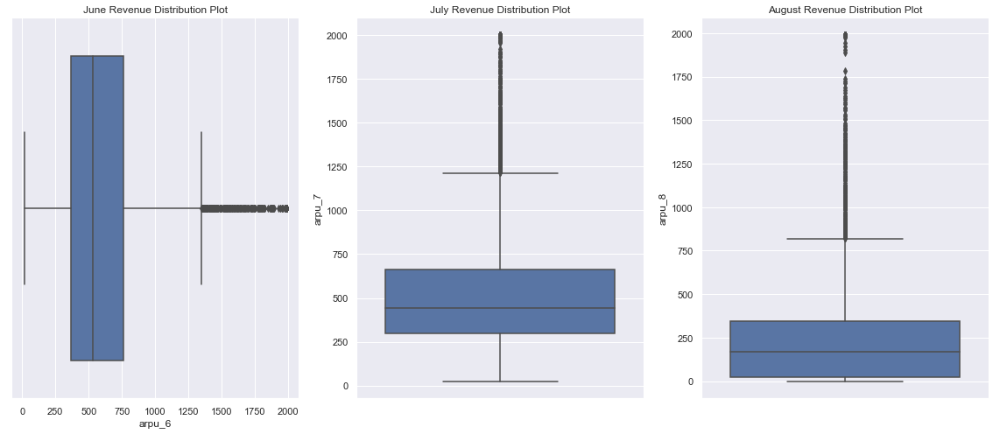

In [187]:
sns.set(font_scale = 1)
plt.figure(figsize=(20,8))

plt.subplot(1,3,1)
plt.title('June Revenue Distribution Plot')
sns.boxplot(telecom_churn_revenue_analysis.arpu_6)

plt.subplot(1,3,2)
plt.title('July Revenue Distribution Plot')
sns.boxplot(y=telecom_churn_revenue_analysis.arpu_7)

plt.subplot(1,3,3)
plt.title('August Revenue Distribution Plot')
sns.boxplot(y=telecom_churn_revenue_analysis.arpu_8)


plt.show()

In [192]:
jun_revenue_loss_churn = telecom_churn_revenue_analysis['arpu_6'].mean()
jul_revenue_loss_churn = telecom_churn_revenue_analysis['arpu_7'].mean()
aug_revenue_loss_churn = telecom_churn_revenue_analysis['arpu_8'].mean()

In [208]:
import locale
locale.setlocale(locale.LC_ALL, 'en_US')
locale.format("%d", 1255000, grouping=True)

'1,255,000'

In [213]:
print('Average Revenue Lost Per Customer (June): INR ', round(jun_revenue_loss_churn, 2))
print('Average Revenue Lost Per Customer (June): INR ', round(jul_revenue_loss_churn,2))
print('Average Revenue Lost Per Customer (June): INR ', round(aug_revenue_loss_churn, 2))

print("==========================================================================================")

print('Total Revenue (Jun): INR ', round(jun_revenue_loss_churn * 6057, 2))
print('Total Revenue (Jul): INR ', round(jul_revenue_loss_churn * 6057, 2))
print('Total Revenue (Aug): INR ', round(aug_revenue_loss_churn * 6057, 2))

Average Revenue Lost Per Customer (June): INR  607.29
Average Revenue Lost Per Customer (June): INR  531.05
Average Revenue Lost Per Customer (June): INR  245.14
Total Revenue (Jun): INR  3678330.13
Total Revenue (Jul): INR  3216552.8
Total Revenue (Aug): INR  1484794.66


In [214]:
print("Average Revenue Lost Per Customer: (INR)", jun_revenue_loss_churn + jul_revenue_loss_churn + aug_revenue_loss_churn)

Average Revenue Lost Per Customer: (INR) 1383.4699667459147


In [222]:
print("Total Revenue Lost: (INR)", round((jun_revenue_loss_churn + jul_revenue_loss_churn + aug_revenue_loss_churn) * 6057, 2))

Total Revenue Lost: (INR) 8379677.59


In [218]:
telecom_df.shape

(29979, 67)

In [219]:
jun_total_revenue = telecom_df['arpu_6'].mean()
jul_total_revenue = telecom_df['arpu_7'].mean()
aug_total_revenue = telecom_df['arpu_8'].mean()

In [221]:
print('Total Revenue Per Customer (June): INR ', round(jun_total_revenue, 2))
print('Average Revenue Per Customer (June): INR ', round(jul_total_revenue,2))
print('Average Revenue Per Customer (June): INR ', round(aug_total_revenue, 2))

print("==========================================================================================")

print('Total Revenue (Jun): INR ', round(jun_total_revenue * 29979, 2))
print('Total Revenue (Jul): INR ', round(jul_total_revenue * 29979, 2))
print('Total Revenue (Aug): INR ', round(aug_total_revenue * 29979, 2))

Total Revenue Per Customer (June): INR  578.12
Average Revenue Per Customer (June): INR  579.93
Average Revenue Per Customer (June): INR  524.62
Total Revenue (Jun): INR  17331333.26
Total Revenue (Jul): INR  17385847.38
Total Revenue (Aug): INR  15727550.75


In [223]:
print("Average Revenue Per Customer: (INR)", jun_total_revenue + jul_total_revenue + aug_total_revenue)

Average Revenue Per Customer: (INR) 1682.6689146068866


In [224]:
print("Total Revenue: (INR)", round((jun_total_revenue + jul_total_revenue + aug_total_revenue) * 29979, 2))

Total Revenue: (INR) 50444731.39


In [226]:
telecom_analysis_churn.head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,offnet_mou_6,offnet_mou_7,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,loc_og_t2t_mou_6,loc_og_t2m_mou_6,loc_og_t2f_mou_6,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,isd_og_mou_6,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,loc_ic_t2t_mou_6,loc_ic_t2m_mou_6,loc_ic_t2f_mou_6,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2m_mou_6,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,isd_ic_mou_6,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aug_vbc_3g,int_usage_median,tenure_buck_1_to_2,tenure_buck_2_to_3,tenure_buck_3_to_4,tenure_buck_4_to_10,Predicted Churn
0,430.975,299.8690,187.894,50.51,296.29,229.740,0.0,2.83,0.00,42.61,273.29,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,3.26,5.91,0.00,41.33,226.81,8.71,68.79,78.64,18.68,0.51,0.0,2.18,0.0,0.00,0.00,0.0,10,6,110,110,130,30.0,31.0,14.0,100,100.0,130,0,0,0,0.0,0,0,0,0,0,0,0,0.0,1,1,0,0,0,Churn
1,690.008,25.6006,25.499,1185.91,61.64,1.099,0.0,4.76,4.81,38.99,58.54,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,2.58,0.00,0.00,0.93,34.54,47.41,0.00,8.63,0.00,1.28,0.00,0.0,0.00,0.0,0.00,0.00,0.0,19,2,110,0,30,30.0,30.0,25.0,30,0.0,0,0,0,0,0.0,0,0,0,0,0,0,0,0.0,1,1,0,0,0,Churn
2,1873.271,575.9270,179.218,2061.69,1087.76,258.290,0.0,0.00,0.00,611.18,1012.04,19.34,0.06,0.0,0.0,0.0,0.0,0.0,0.0,1.58,1.34,0.00,1.45,361.94,842.49,7.94,19.24,46.38,18.91,0.00,0.0,0.00,0.0,0.00,0.00,0.0,13,5,250,250,130,29.0,23.0,28.0,250,110.0,130,0,0,0,0.0,0,0,0,0,0,0,0,0.0,1,0,0,1,0,Churn
3,809.518,794.7750,33.060,181.63,1608.76,1585.240,0.0,1.31,0.00,12.48,35.76,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,1.59,0.00,0.00,212.03,40.88,2.76,0.00,1.51,0.18,0.00,0.0,0.00,0.0,0.00,0.00,0.0,16,8,110,110,50,30.0,28.0,31.0,110,110.0,50,0,0,0,0.0,0,0,0,0,0,0,0,0.0,1,1,0,0,0,Churn
4,374.863,294.0230,183.043,433.59,74.54,43.660,0.0,0.00,6.16,2.83,16.99,3.54,0.40,0.0,0.0,0.0,0.0,0.0,0.0,2.54,11.81,2.01,0.86,11.61,16.94,0.98,0.49,1.36,0.00,0.00,0.0,0.00,0.0,1.36,1.83,0.0,14,17,36,44,36,29.0,31.0,30.0,30,20.0,0,0,0,0,0.0,0,0,0,0,0,0,0,0.0,1,1,0,0,0,Churn
